##  PREDICTION DU PRIX DE  L’OR 

  1.analyse exploratoire 
    
       a.Identification de la target 
        
       b.Nombre des lignes et de colonnes 
    
       c.Identification des valeurs manquantes
        
       d.Types de variables
    
       e.Visualisation de la cible (target)
        
       f.Compréhension des différentes variables 
    
       g.Visualisation des relations : features/target 
            
       h.Identification des outliers
    
  2.Prédire le prix de l’or

       a.Pre-processing
    
       b.Modélisation
        

#  IMPORTATION DES LIBRAIRIES ET DU JEU DE DONNEES

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings 
warnings.filterwarnings('ignore')
from sklearn.preprocessing import RobustScaler
from sklearn.ensemble import RandomForestRegressor
from matplotlib.pyplot import figure
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
#from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.dates as mdates
from sklearn import linear_model
#from sklearn.model_selection import TimeSeriesSplit
from sklearn.svm import SVR
from sklearn.model_selection import learning_curve
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from scipy import stats

In [2]:
df=pd.read_csv('FINAL_USO.csv',index_col='Date',parse_dates=True)


In [3]:
data=pd.read_csv('FINAL_USO.csv')

In [4]:
pd.set_option('display.max_columns', df.shape[1])

In [5]:
df

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,SP_volume,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,EG_volume,EU_Price,EU_open,EU_high,EU_low,EU_Trend,OF_Price,OF_Open,OF_High,OF_Low,OF_Volume,OF_Trend,OS_Price,OS_Open,OS_High,OS_Low,OS_Trend,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,SF_Trend,USB_Price,USB_Open,USB_High,USB_Low,USB_Trend,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLT_Trend,PLD_Price,PLD_Open,PLD_High,PLD_Low,PLD_Trend,RHO_PRICE,USDI_Price,USDI_Open,USDI_High,USDI_Low,USDI_Volume,USDI_Trend,GDX_Open,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,123.029999,123.199997,121.989998,122.180000,105.441238,199109200,11825.29004,11967.83984,11825.21973,11868.80957,11868.80957,136930000,74.550003,76.150002,72.150002,72.900002,70.431755,787900,1.3018,1.2982,1.3051,1.2957,1,105.09,104.88,106.50,104.88,14330,1,93.42,94.91,96.00,93.33,0,53604,54248,54248,52316,119440,1,1.911,1.911,1.911,1.911,1,1414.65,1420.30,1423.35,1376.85,0,618.85,614.70,615.00,614.60,1,1425,80.341,80.565,80.630,80.130,22850,0,53.009998,53.139999,51.570000,51.680000,48.973877,20605600,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,122.230003,122.949997,121.300003,121.589996,105.597549,220481400,11870.25000,11968.17969,11819.30957,11866.38965,11866.38965,389520000,73.599998,75.099998,73.349998,74.900002,72.364037,896600,1.3035,1.3020,1.3087,1.2997,1,103.35,103.51,104.56,102.46,140080,0,93.79,93.43,94.80,92.53,1,53458,53650,54030,52890,65390,0,1.851,1.851,1.851,1.851,0,1420.25,1414.75,1431.75,1400.70,1,623.65,622.60,623.45,622.30,1,1400,80.249,80.175,80.395,79.935,13150,0,52.500000,53.180000,52.040001,52.680000,49.921513,16285400,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,122.059998,122.320000,120.029999,120.290001,104.468536,183903000,11866.54004,11925.87988,11735.19043,11766.25977,11766.25977,135170000,69.099998,69.800003,64.199997,64.699997,62.509384,2096700,1.2995,1.3043,1.3044,1.2981,0,103.64,103.63,104.57,102.37,147880,1,94.09,93.77,94.43,92.55,1,52961,53400,53400,52544,67280,0,1.810,1.810,1.810,1.810,0,1411.10,1422.65,1427.60,1404.60,0,608.80,626.00,630.00,608.60,0,1400,80.207,80.300,80.470,80.125,970,0,52.490002,52.549999,51.029999,51.169998,48.490578,15120200,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,122.180000,124.139999,120.370003,123.930000,107.629784,225418100,11769.20996,12117.12988,11768.83008,12103.58008,12103.58008,165180000,66.449997,68.099998,66.000000,67.000000,64.731514,875300,1.3079,1.3003,1.3133,1.2994,1,106.73,104.30,107.27,103.91,170240,1,95.55,96.39,99.70,96.39,1,53487,52795,53575,52595,55130,1,1.927,1.927,1.927,1.927,1,1434.75,1408.95,1436.55,1408.15,1,626.65,622.45,622.45,622.45,1,1400,80.273,80.890,80.940,80.035,22950,1,52.380001,53.250000,52.369999,52.990002,50.215282,11644900,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,123.930000,124.360001,122.750000,124.169998,107.838242,194230900,12103.58008,12119.70020,11999.44043,12107.74023,12107.74023,163250000,67.099998,69.400002,66.900002,68.500000,66.180725,837600,1.3045,1.3079,1.3197,1.3024,0,107.71,107.15,108.17,106.16,145090,1,99.01,97.54,99.26,96.81,1,53148,53519,54184,52937,75950,0,1.970,1.970,1.970,1.970,1,1429.05,1434.40,1453.75,1417.65,0,635.90,625.70,641.50,623.80,1,1400,80.350,80.105,80.445,79.550,24140,1,53.150002,53.430000,52.419998,52.959999,50.186852,8724300,37.669998,38.240002,37.520000,38.110001,38.110001,10728000


# ANALYSE EXPLORATOIRE

In [6]:
df.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SP_open',
       'SP_high', 'SP_low', 'SP_close', 'SP_Ajclose', 'SP_volume', 'DJ_open',
       'DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume', 'EG_open',
       'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume', 'EU_Price',
       'EU_open', 'EU_high', 'EU_low', 'EU_Trend', 'OF_Price', 'OF_Open',
       'OF_High', 'OF_Low', 'OF_Volume', 'OF_Trend', 'OS_Price', 'OS_Open',
       'OS_High', 'OS_Low', 'OS_Trend', 'SF_Price', 'SF_Open', 'SF_High',
       'SF_Low', 'SF_Volume', 'SF_Trend', 'USB_Price', 'USB_Open', 'USB_High',
       'USB_Low', 'USB_Trend', 'PLT_Price', 'PLT_Open', 'PLT_High', 'PLT_Low',
       'PLT_Trend', 'PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low',
       'PLD_Trend', 'RHO_PRICE', 'USDI_Price', 'USDI_Open', 'USDI_High',
       'USDI_Low', 'USDI_Volume', 'USDI_Trend', 'GDX_Open', 'GDX_High',
       'GDX_Low', 'GDX_Close', 'GDX_Adj Close', 'GDX_Volume', 'USO_Open',
       'USO_High', 'USO

a. identification de la variable cible

la variable cible (variable à predire) est le cours de clôture ajusté 'Adj Close'.

b.Nombre de ligne et de colonne

In [7]:
df.shape

(1718, 80)

jeu de données de 1718 lignes et 80 colonnes

c.Identification des valeurs manquantes

In [8]:
df.isna().sum().sum()
df.isna().values.any()

False

Aucune donnée manquante, on peut même l'observé graphiquement.

<AxesSubplot:ylabel='Date'>

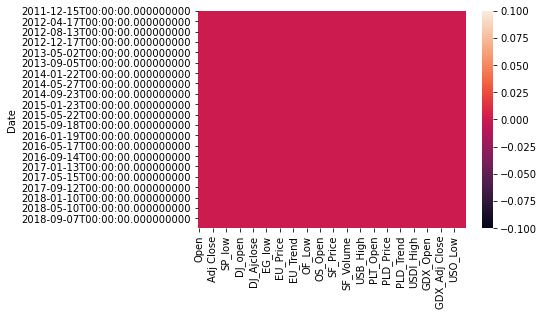

In [9]:
sns.heatmap(df.isna())

d.Type de variable

In [10]:
df.select_dtypes(include='object').columns

Index([], dtype='object')

In [11]:
df.select_dtypes(exclude='object').columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SP_open',
       'SP_high', 'SP_low', 'SP_close', 'SP_Ajclose', 'SP_volume', 'DJ_open',
       'DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume', 'EG_open',
       'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume', 'EU_Price',
       'EU_open', 'EU_high', 'EU_low', 'EU_Trend', 'OF_Price', 'OF_Open',
       'OF_High', 'OF_Low', 'OF_Volume', 'OF_Trend', 'OS_Price', 'OS_Open',
       'OS_High', 'OS_Low', 'OS_Trend', 'SF_Price', 'SF_Open', 'SF_High',
       'SF_Low', 'SF_Volume', 'SF_Trend', 'USB_Price', 'USB_Open', 'USB_High',
       'USB_Low', 'USB_Trend', 'PLT_Price', 'PLT_Open', 'PLT_High', 'PLT_Low',
       'PLT_Trend', 'PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low',
       'PLD_Trend', 'RHO_PRICE', 'USDI_Price', 'USDI_Open', 'USDI_High',
       'USDI_Low', 'USDI_Volume', 'USDI_Trend', 'GDX_Open', 'GDX_High',
       'GDX_Low', 'GDX_Close', 'GDX_Adj Close', 'GDX_Volume', 'USO_Open',
       'USO_High', 'USO

In [12]:
df.dtypes.value_counts()

float64    58
int64      22
dtype: int64

Ce jeu de données ne contient que des variables quantitatives dont 22 sont discretes  et 58 sont continues

e.Visualisation de la variable cible

In [13]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [14]:
#df['Adj Close'].plot(figsize=(17,8))
data=pd.read_csv('FINAL_USO.csv')
import plotly.express as px
fig = px.line(data, x = 'Date', y = "Adj Close")
fig.show()

La clôture ajustée chute entre 2012 et 2018  de 150 à  120  soit une baisse 20%, mais avec une evolution qui devient plus ou  moins stationnaire de juin 2014 à decembre 2018.Le pic le plus elevé de la clôture ajusté se situe en octobre 2012 avec une valeur 173,61 tandis que le niveau  le plus bas est evalué à  100,5 à la date de janvier 2015. Finalement,de 2014 à 2018 il se suit une décadence de ce cours jusqu'à ce stabilisé autour de 121,65.

D'autre part, De decembre 2011 à fevrier 2012 la cloture ajusté est passé de 151,99 à 173,49 ce qui marque une croissance de cette valeur. La cause la plus évidente de cette escalade fulgurante des prix de l’or, qui ont été multipliés par cinq entre 2000 et 2011, est la crise financière de 2008. Celle-ci a convaincu de nouveaux acheteurs de placer leurs économies dans l’or : à cause de l’effet délétère des subprimes et des actifs toxiques (https://achatorphysique.com/evolution-cours-or-10-20-ans)

Il faut signifier que  cette valeur chute par la suite jusqu'à  mai de la meme année.cela est peut être dû à un contexte de fortes pressions à la vente  (c’est-à-dire sans restriction de prix ou de délai de vente), le marché se retrouvant noyé sous les ordres agressifs de vente ou peut être La plupart des titres qui ont commencé à coter s’échangeaient à des niveaux anormalement bas.Aussi, La tendance à la baisse du cours de l'or  en 2012 pourrait  s'expliquer avant tout par le fléchissement économique de la Chine, grand acteur du secteur : un recul de 6 % a été enregistré dans la joaillerie et la demande d'or a chuté de 8 % en comparaison de 2011( Boursorama cours de l'or en 2012  EDIT-PLACE  21/01/2013 à 01:00).


Le revirement du cours de l'or à la baisse entre 2014 et 2018  est en parti dû aux  investisseurs institutionnels, qui ont déstocké une énorme quantité de trackers, le désintérêt de certains spéculateurs ou encore la perspective de la hausse des taux d’intérêt.

f.Comprehension des differentes variables

In [15]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,SP_volume,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,EG_volume,EU_Price,EU_open,EU_high,EU_low,EU_Trend,OF_Price,OF_Open,OF_High,OF_Low,OF_Volume,OF_Trend,OS_Price,OS_Open,OS_High,OS_Low,OS_Trend,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,SF_Trend,USB_Price,USB_Open,USB_High,USB_Low,USB_Trend,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLT_Trend,PLD_Price,PLD_Open,PLD_High,PLD_Low,PLD_Trend,RHO_PRICE,USDI_Price,USDI_Open,USDI_High,USDI_Low,USDI_Volume,USDI_Trend,GDX_Open,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
count,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03
mean,127.323434,127.854237,126.777695,127.319482,127.319482,8.446327e+06,204.490023,205.372637,203.487014,204.491222,192.204570,1.098026e+08,18161.094398,18244.137842,18073.889095,18164.119043,18164.119043,1.779131e+08,28.276554,28.822555,27.653655,28.209302,27.783958,1.136074e+06,1.208494,1.208531,1.213360,1.203692,0.494761,77.504523,77.521740,78.384936,76.593894,225958.585565,0.498836,70.153097,70.275396,71.120256,69.330990,0.503492,43284.478463,43308.692084,43671.194412,42911.912107,26912.462165,0.480792,2.262769,2.263091,2.286512,2.238765,0.490105,1183.915425,1184.388853,1194.274622,1173.409692,0.484284,766.805122,766.363481,773.529302,759.444208,0.530850,1130.442375,89.809427,89.805442,90.098981,89.509331,27568.300349,0.512806,26.747427,27.071304,26.384575,26.715012,25.924624,4.356515e+07,22.113417,22.307148,21.904657,22.109051,22.109051,1.922313e+07
std,17.526993,17.631189,17.396513,17.536269,17.536269,4.920731e+06,43.831928,43.974644,43.618940,43.776999,48.514161,4.925110e+07,3889.752079,3906.008604,3867.959072,3884.495887,3884.495887,1.212753e+08,20.325861,20.620624,19.972314,20.294635,19.721857,7.301289e+05,0.100535,0.100579,0.100184,0.100695,0.500118,27.400703,27.366113,27.393294,27.322868,88844.540581,0.500144,23.471514,23.480047,23.494737,23.422198,0.500133,7530.704012,7550.423242,7614.302267,7443.076538,21880.969122,0.499776,0.433469,0.433977,0.437574,0.429960,0.500048,273.842095,273.978168,275.427791,271.799909,0.499898,148.307189,148.078365,149.010291,147.381087,0.499193,570.012881,7.516115,7.520788,7.567895,7.459269,14643.314699,0.499982,10.620552,10.706388,10.490908,10.603110,9.886570,2.909151e+07,11.431056,11.478671,11.373997,11.432787,11.432787,1.575743e+07
min,100.919998,100.989998,100.230003,100.500000,100.500000,1.501600e+06,122.059998,122.320000,120.029999,120.290001,104.468536,2.785650e+07,11769.209960,11925.879880,11735.190430,11766.259770,11766.259770,8.410000e+06,2.770000,2.850000,2.730000,2.800000,2.800000,1.645000e+05,1.038700,1.039000,1.041900,1.034100,0.000000,27.880000,27.990000,28.750000,27.100000,11520.000000,0.000000,26.550000,27.340000,27.610000,26.180000,0.000000,33170.000000,33146.000000,33566.000000,32626.000000,40.000000,0.000000,1.358000,1.366000,1.391000,1.321000,0.000000,775.600000,765.300000,786.500000,756.000000,0.000000,470.4500

-   Variable quantitatives continues

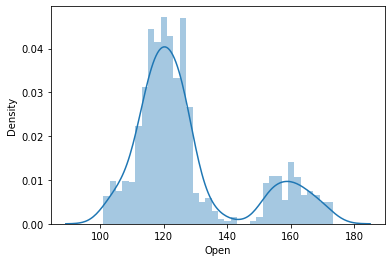

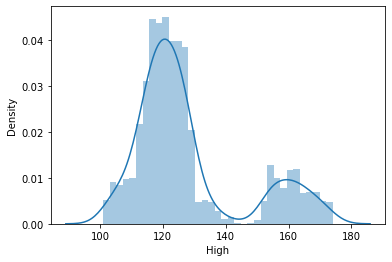

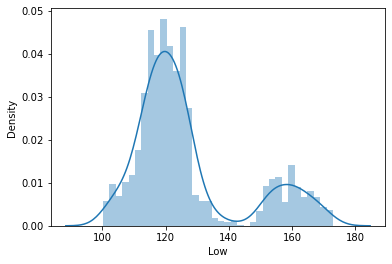

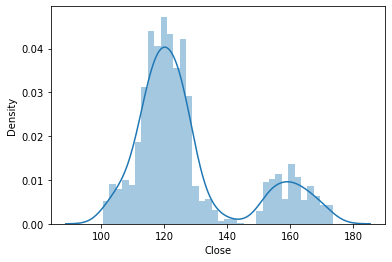

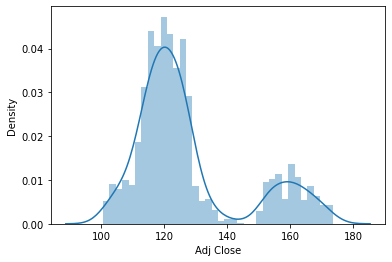

...

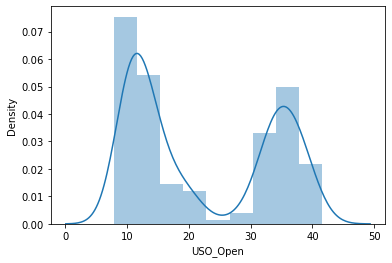

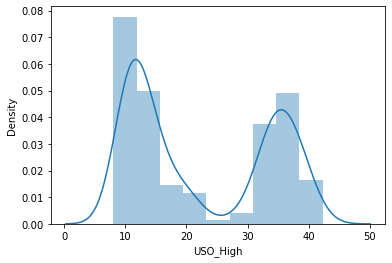

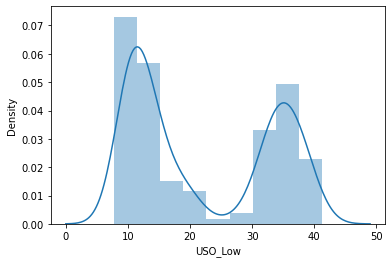

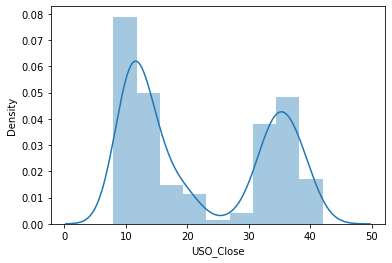

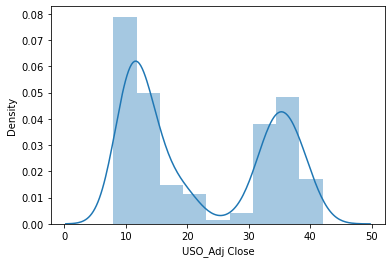

In [16]:
for col in df.select_dtypes('float'):
    plt.figure()
    sns.distplot(df[col])

Aucune tendance de normalité ne se dégage pour chacune des variables

-   variable quantitatives discrètes

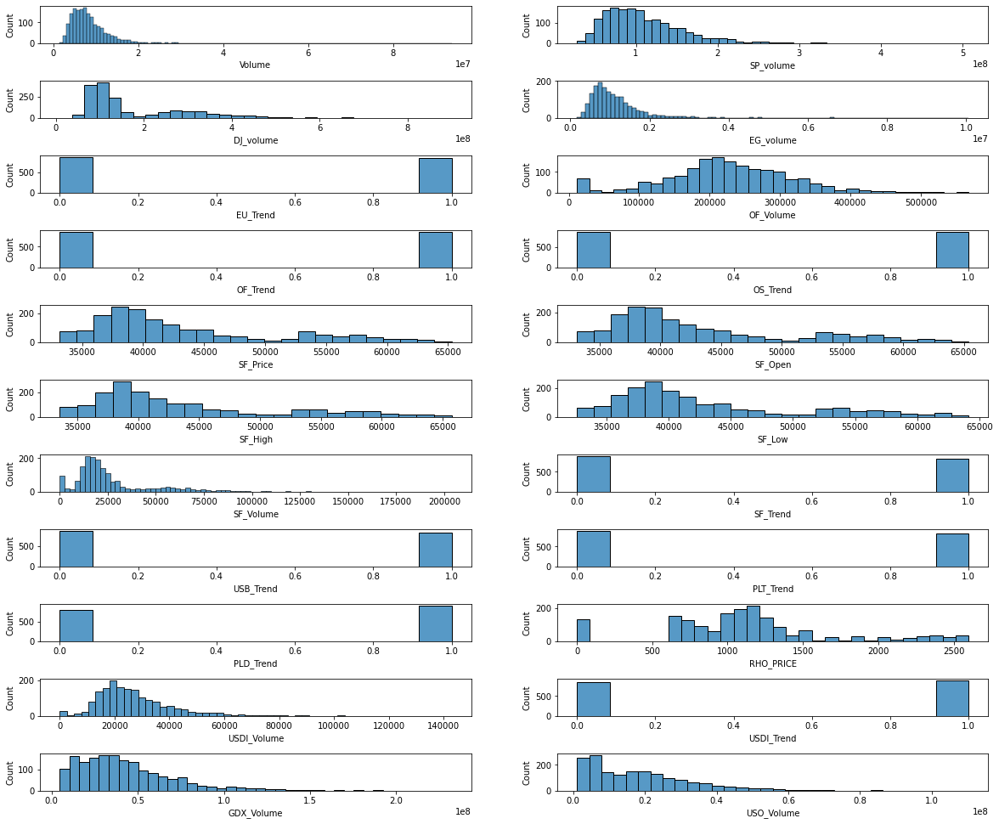

In [17]:
data_quanti=data[['Volume', 'SP_volume', 'DJ_volume', 'EG_volume', 'EU_Trend',
       'OF_Volume', 'OF_Trend', 'OS_Trend', 'SF_Price', 'SF_Open', 'SF_High',
       'SF_Low', 'SF_Volume', 'SF_Trend', 'USB_Trend', 'PLT_Trend',
       'PLD_Trend', 'RHO_PRICE', 'USDI_Volume', 'USDI_Trend', 'GDX_Volume',
       'USO_Volume']]
fig, axes = plt.subplots(11,2,figsize = (20,17)) 
for idx, cat_col in enumerate(data_quanti):
    ligne, col = idx//2, idx%2
    sns.histplot(x = cat_col, data = data_quanti, ax = axes[ligne, col])
    
    plt.subplots_adjust(hspace = 1)

g.Visualisation des relations target/features

<Figure size 864x432 with 0 Axes>

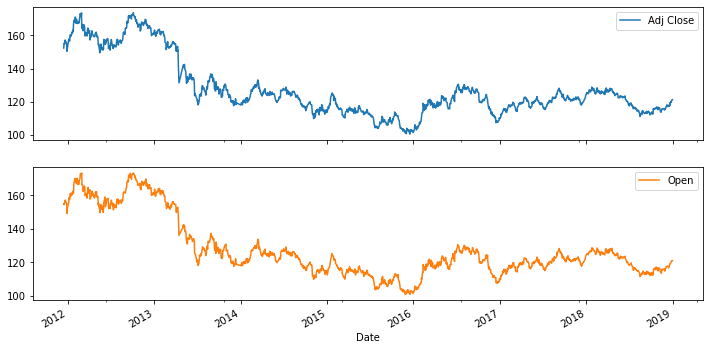

<Figure size 864x432 with 0 Axes>

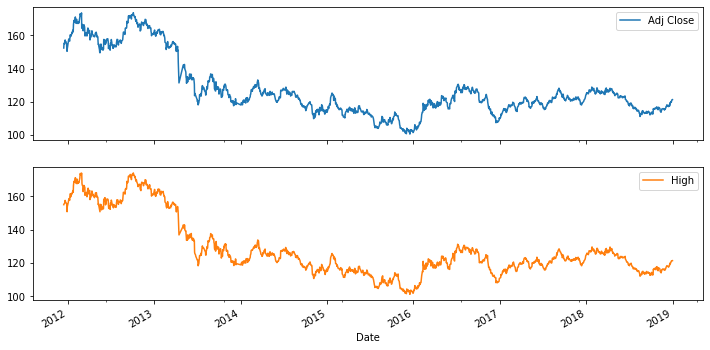

<Figure size 864x432 with 0 Axes>

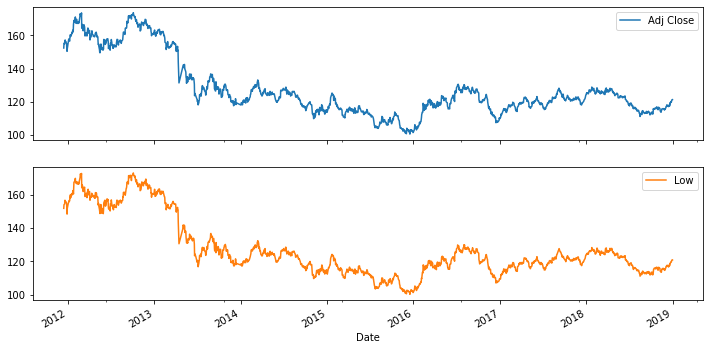

<Figure size 864x432 with 0 Axes>

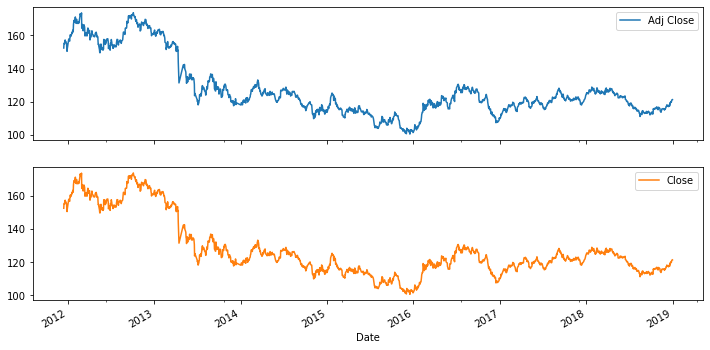

<Figure size 864x432 with 0 Axes>

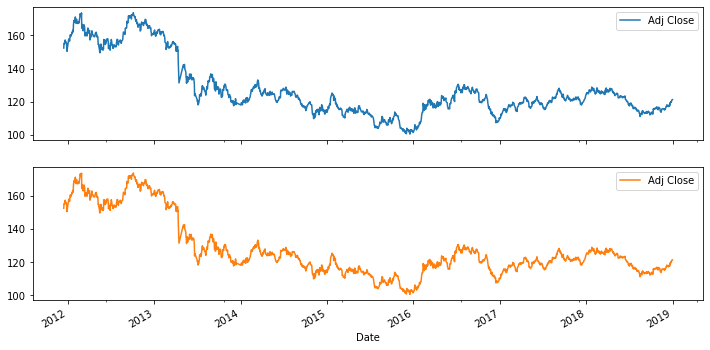

<Figure size 864x432 with 0 Axes>

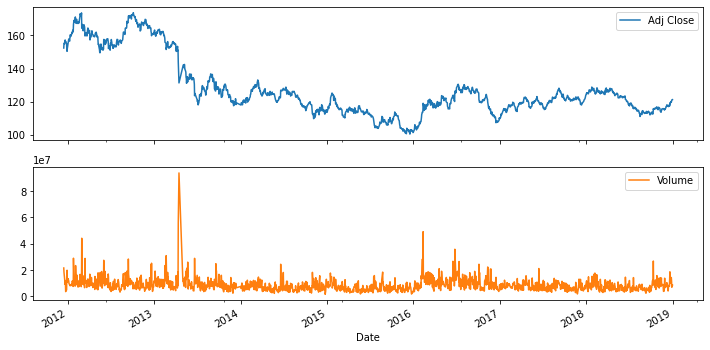

<Figure size 864x432 with 0 Axes>

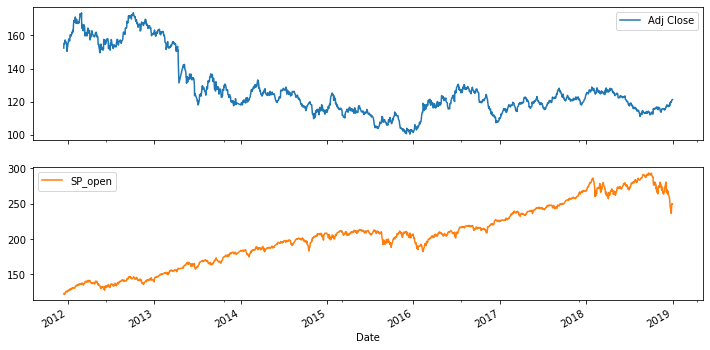

<Figure size 864x432 with 0 Axes>

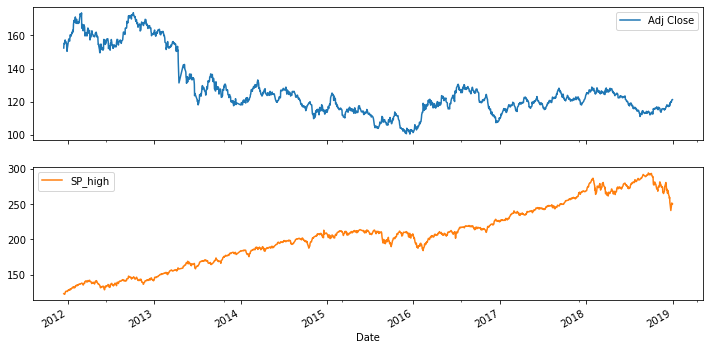

<Figure size 864x432 with 0 Axes>

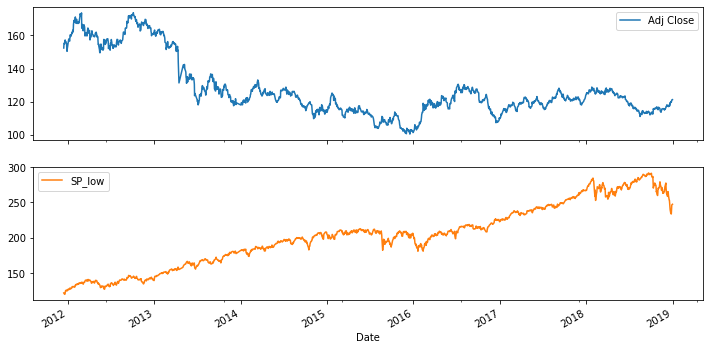

<Figure size 864x432 with 0 Axes>

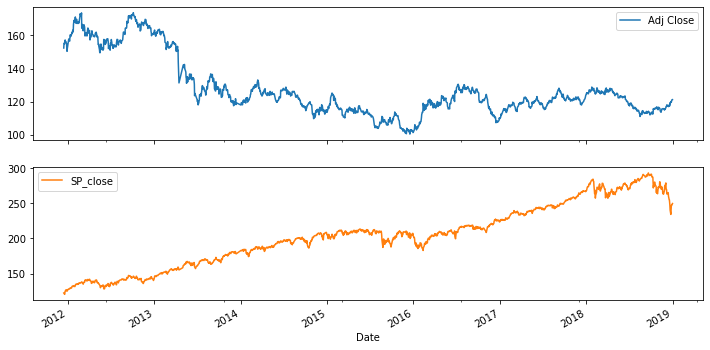

<Figure size 864x432 with 0 Axes>

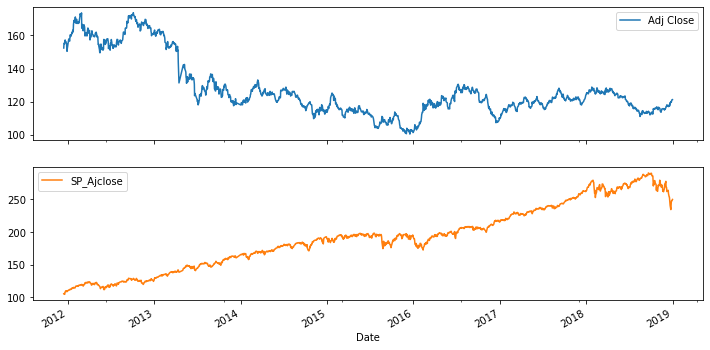

<Figure size 864x432 with 0 Axes>

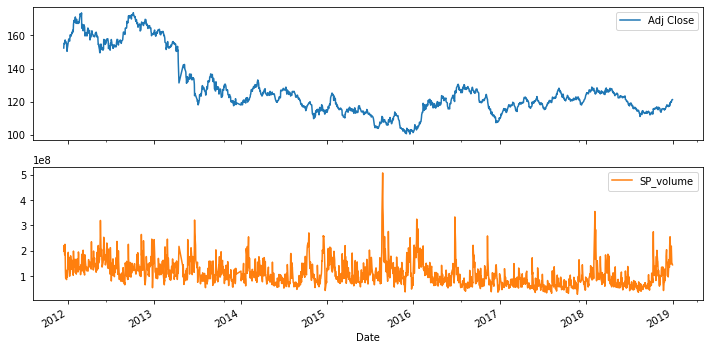

<Figure size 864x432 with 0 Axes>

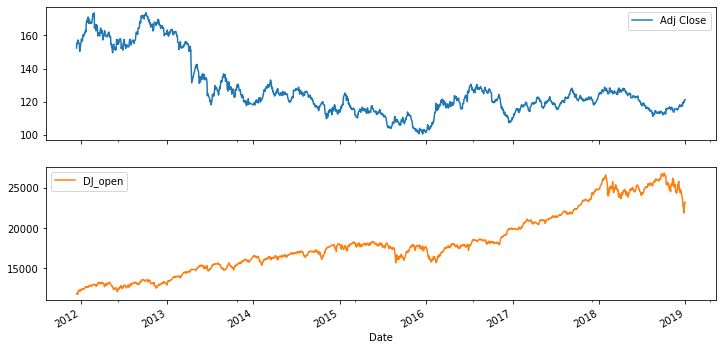

<Figure size 864x432 with 0 Axes>

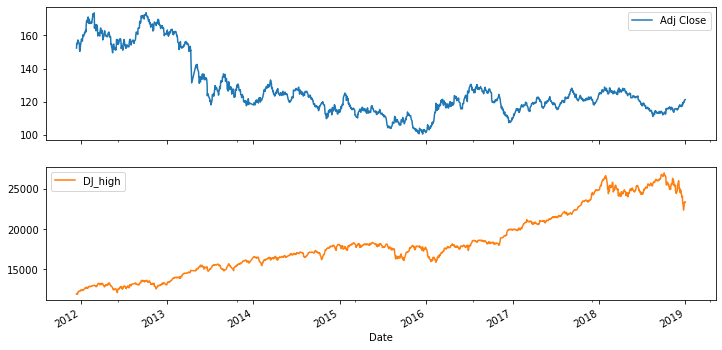

<Figure size 864x432 with 0 Axes>

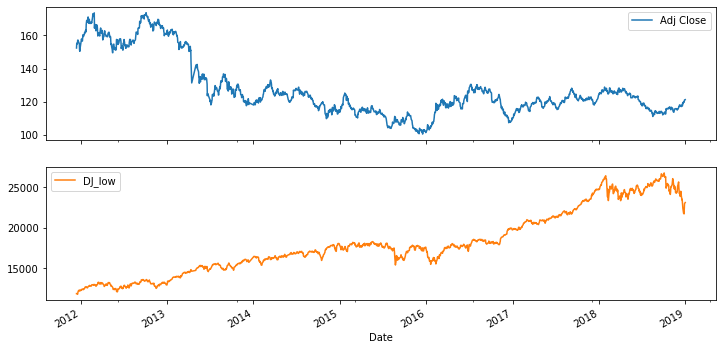

<Figure size 864x432 with 0 Axes>

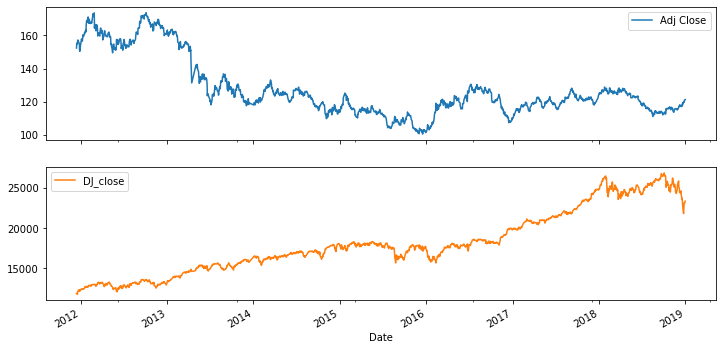

<Figure size 864x432 with 0 Axes>

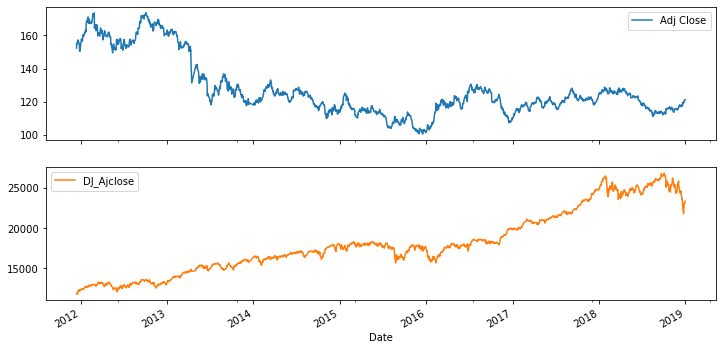

<Figure size 864x432 with 0 Axes>

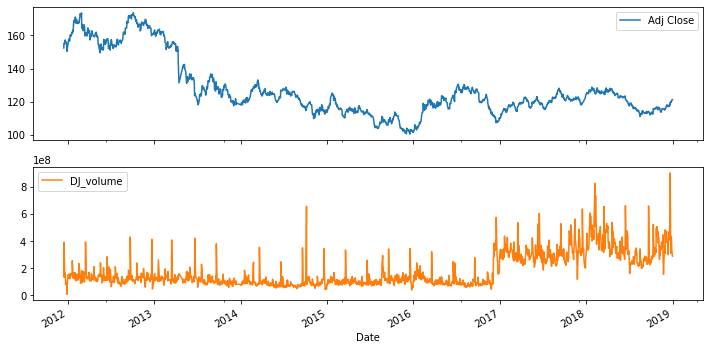

<Figure size 864x432 with 0 Axes>

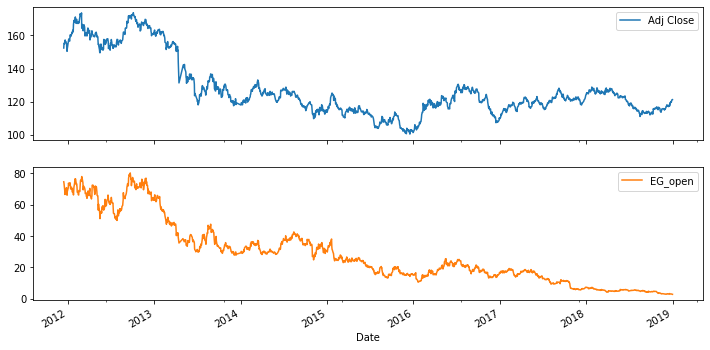

<Figure size 864x432 with 0 Axes>

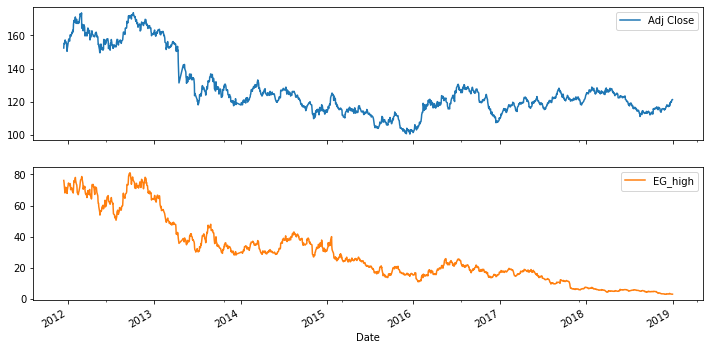

<Figure size 864x432 with 0 Axes>

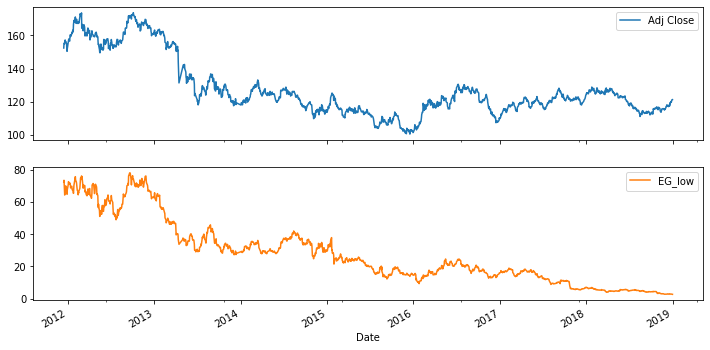

<Figure size 864x432 with 0 Axes>

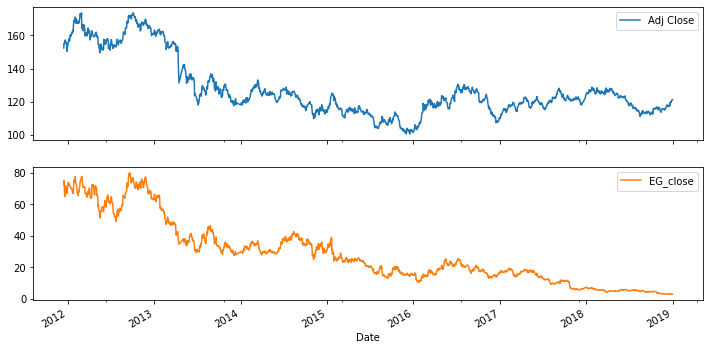

<Figure size 864x432 with 0 Axes>

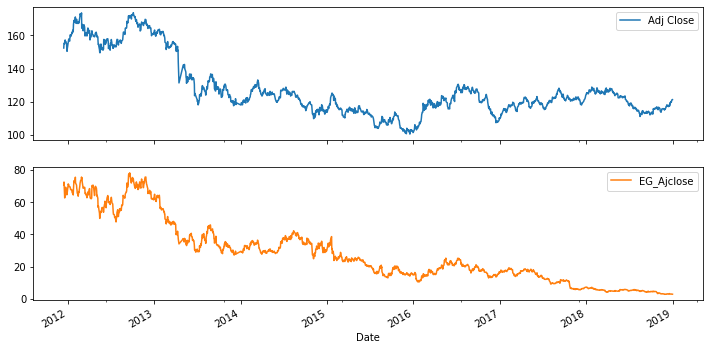

<Figure size 864x432 with 0 Axes>

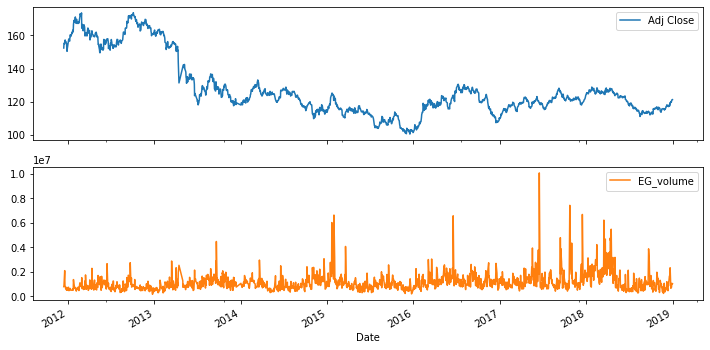

<Figure size 864x432 with 0 Axes>

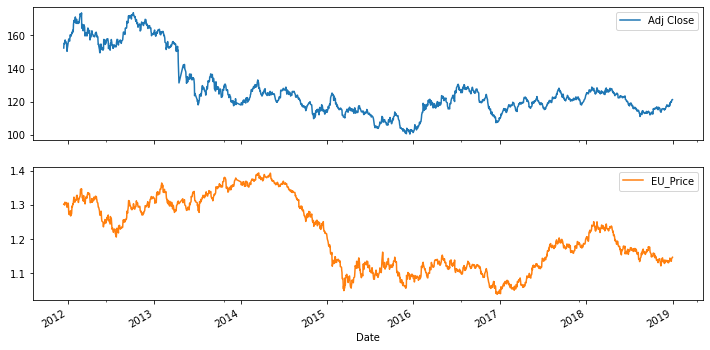

<Figure size 864x432 with 0 Axes>

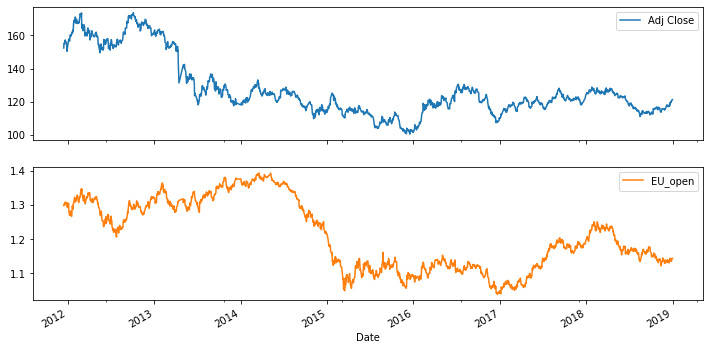

<Figure size 864x432 with 0 Axes>

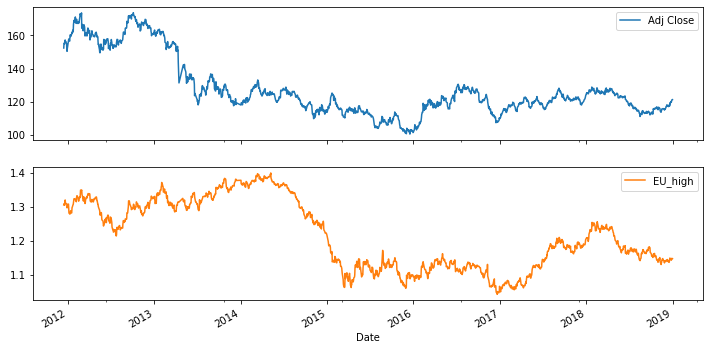

<Figure size 864x432 with 0 Axes>

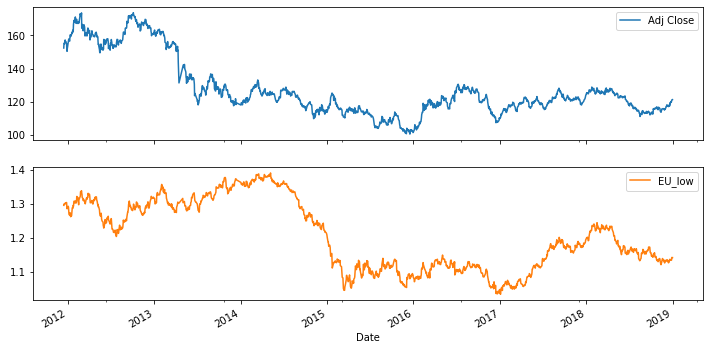

<Figure size 864x432 with 0 Axes>

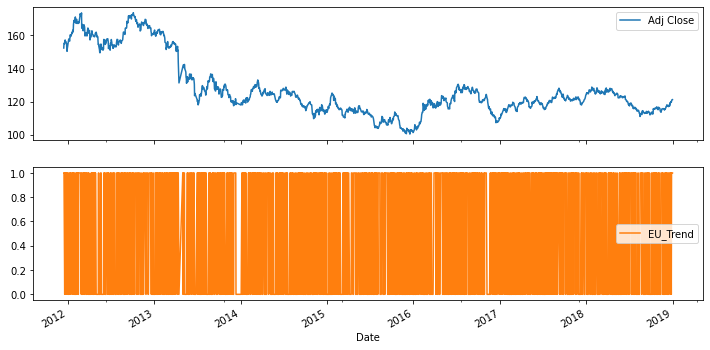

<Figure size 864x432 with 0 Axes>

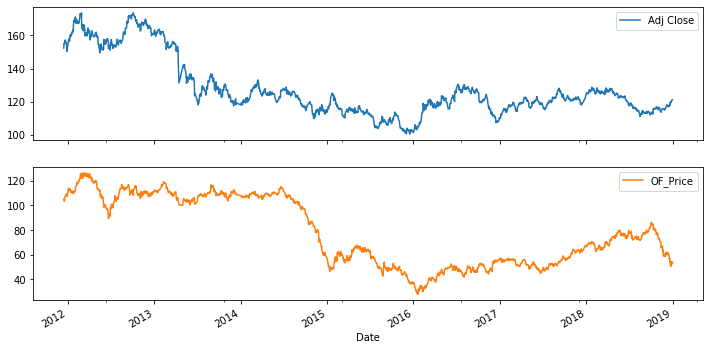

<Figure size 864x432 with 0 Axes>

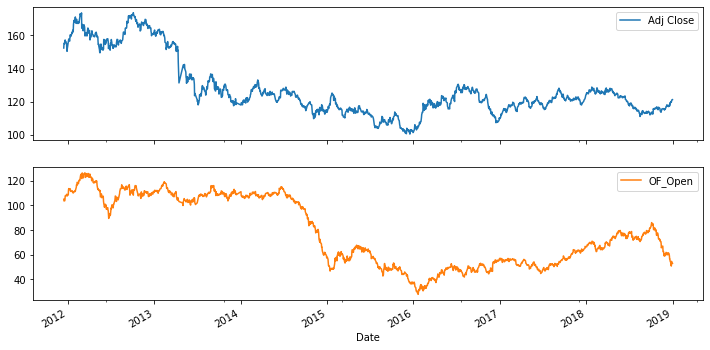

<Figure size 864x432 with 0 Axes>

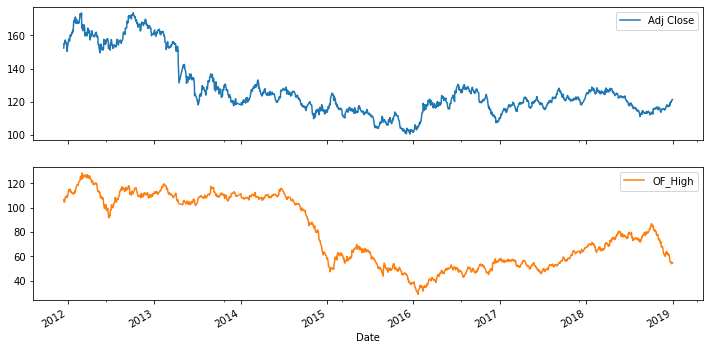

<Figure size 864x432 with 0 Axes>

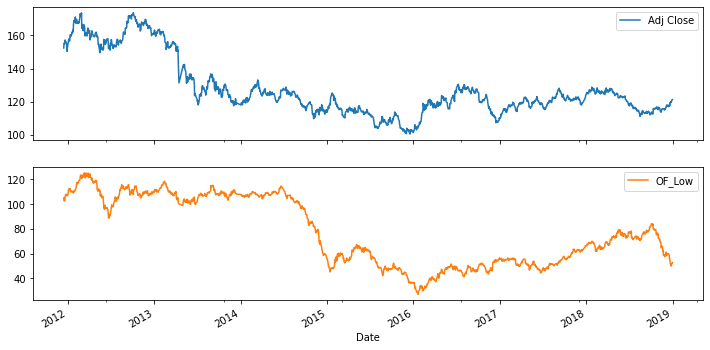

<Figure size 864x432 with 0 Axes>

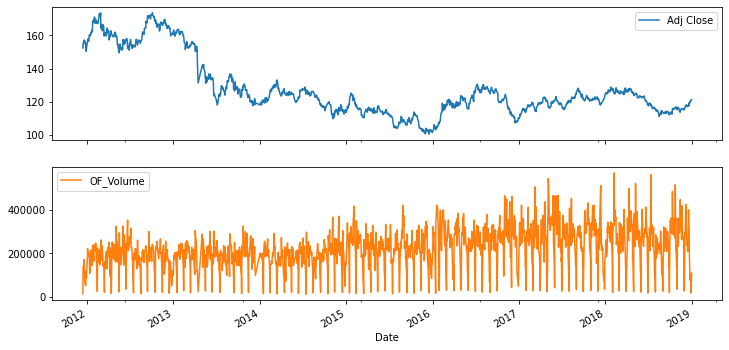

<Figure size 864x432 with 0 Axes>

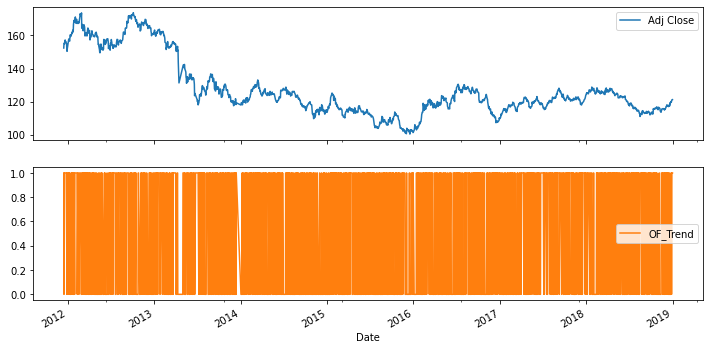

<Figure size 864x432 with 0 Axes>

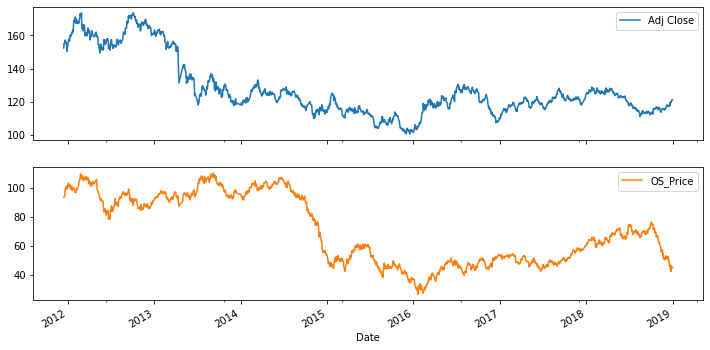

<Figure size 864x432 with 0 Axes>

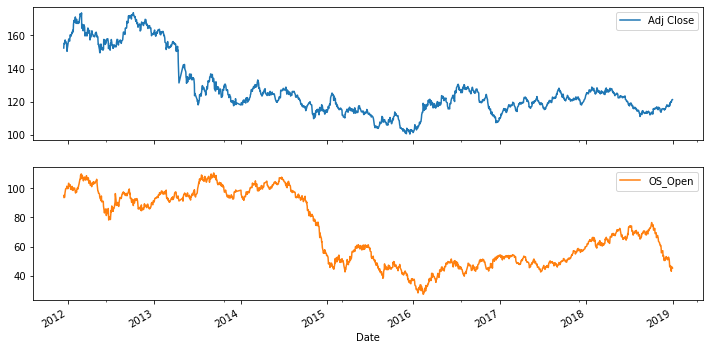

<Figure size 864x432 with 0 Axes>

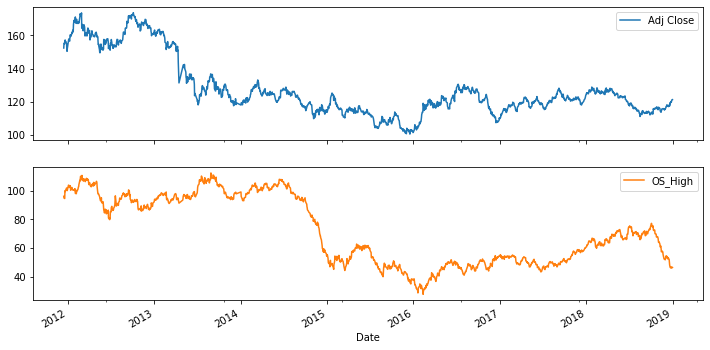

<Figure size 864x432 with 0 Axes>

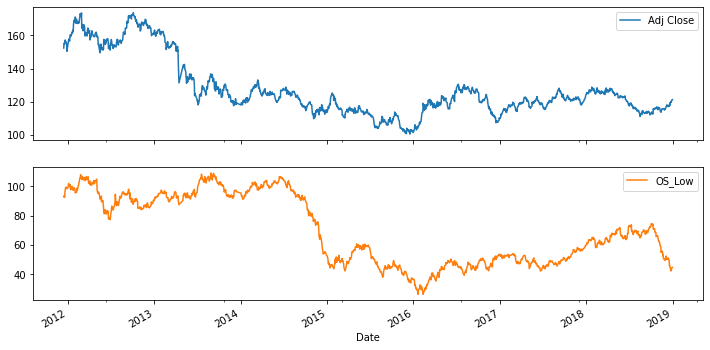

<Figure size 864x432 with 0 Axes>

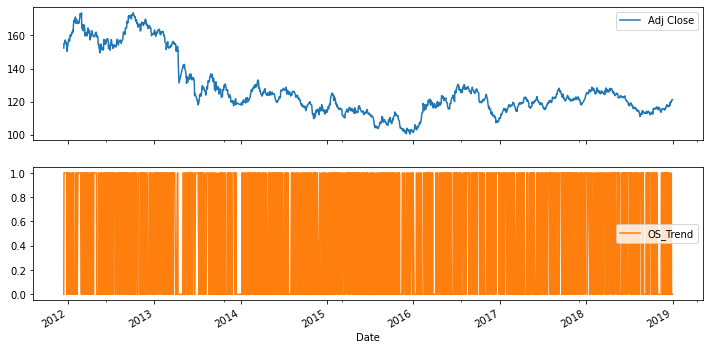

<Figure size 864x432 with 0 Axes>

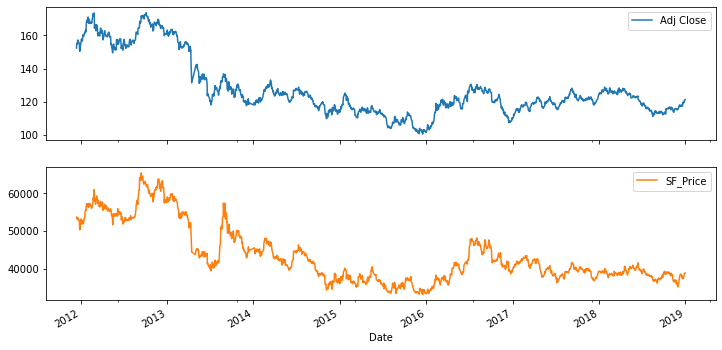

<Figure size 864x432 with 0 Axes>

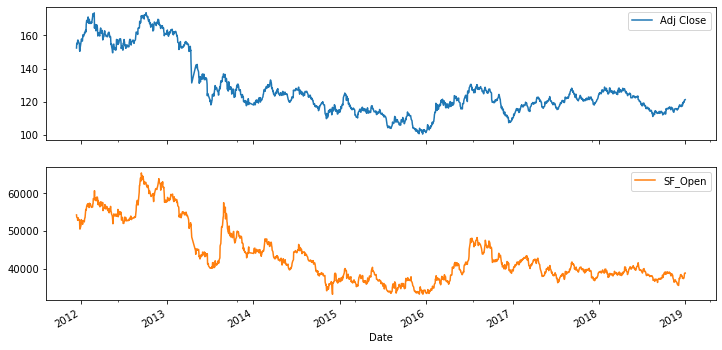

<Figure size 864x432 with 0 Axes>

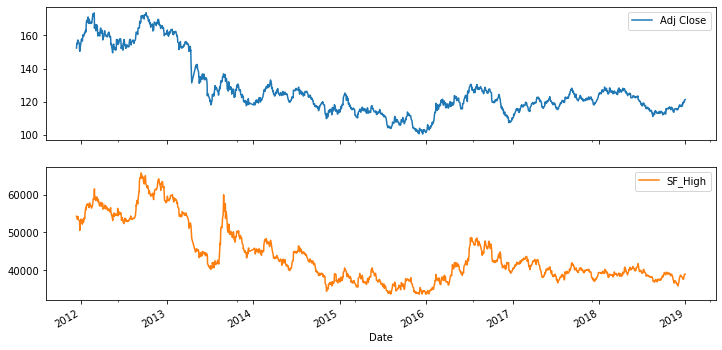

<Figure size 864x432 with 0 Axes>

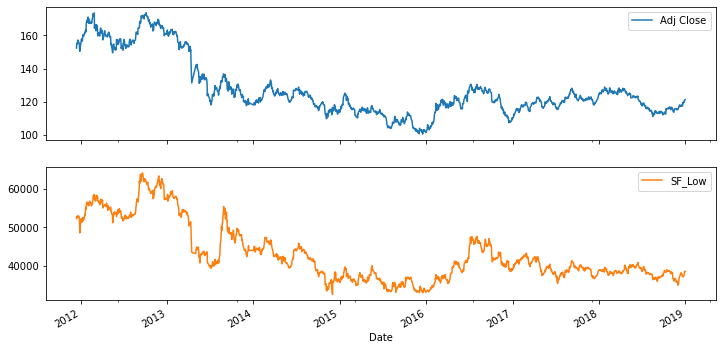

<Figure size 864x432 with 0 Axes>

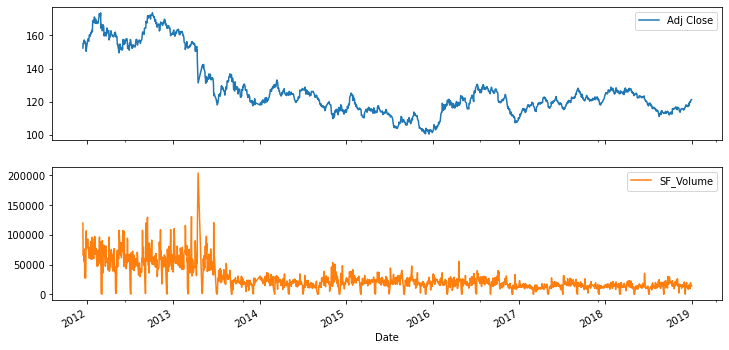

<Figure size 864x432 with 0 Axes>

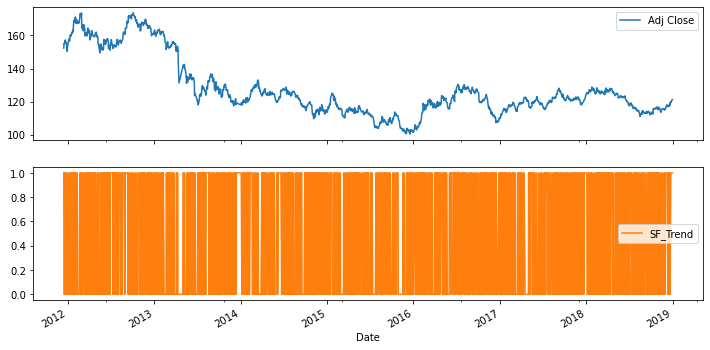

<Figure size 864x432 with 0 Axes>

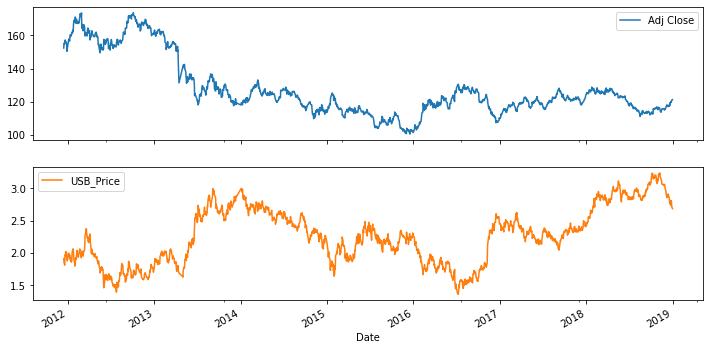

<Figure size 864x432 with 0 Axes>

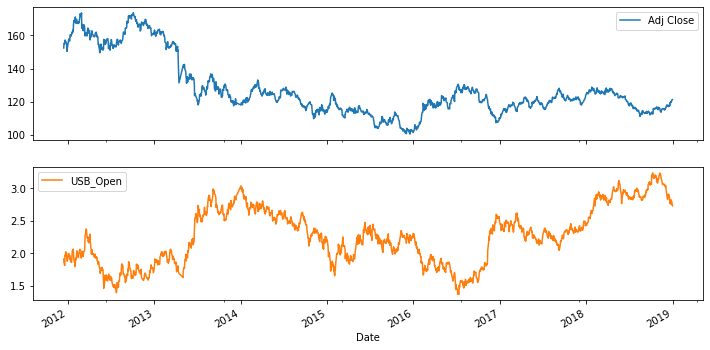

<Figure size 864x432 with 0 Axes>

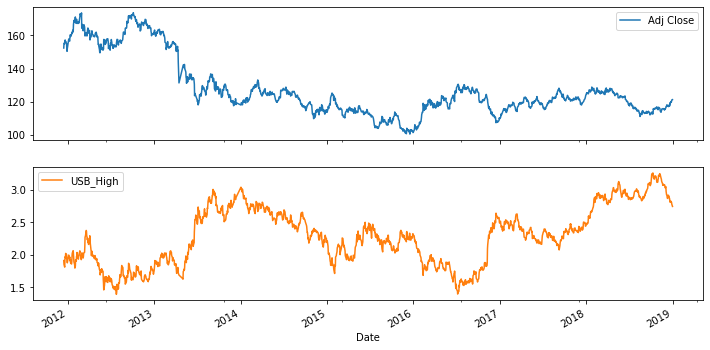

<Figure size 864x432 with 0 Axes>

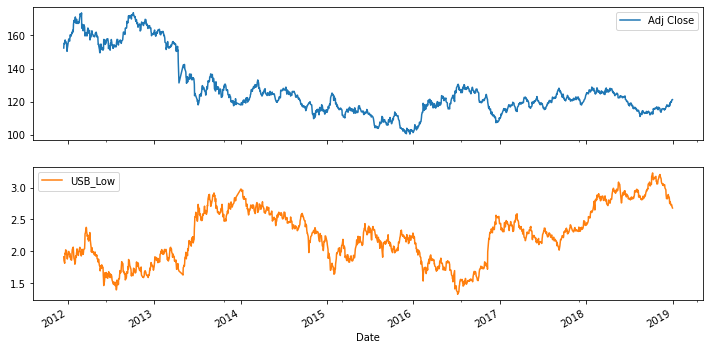

<Figure size 864x432 with 0 Axes>

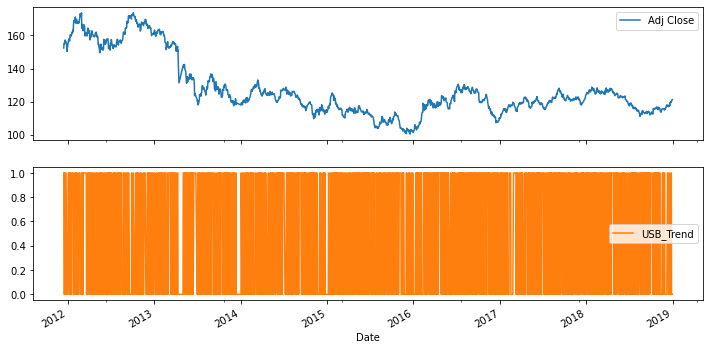

<Figure size 864x432 with 0 Axes>

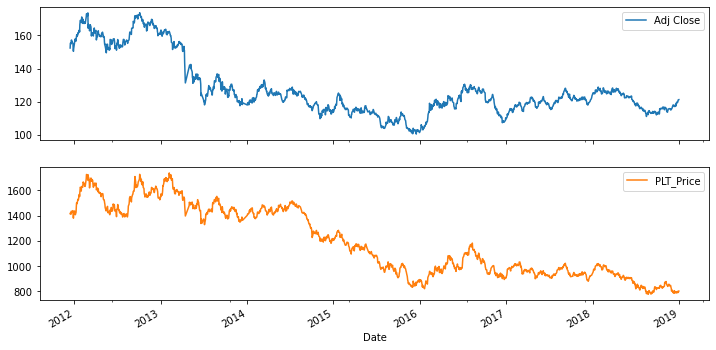

<Figure size 864x432 with 0 Axes>

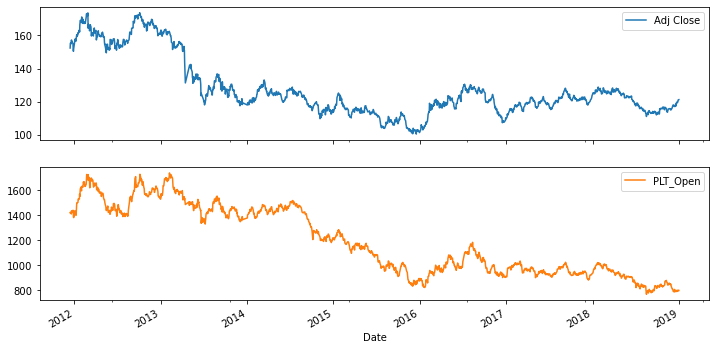

<Figure size 864x432 with 0 Axes>

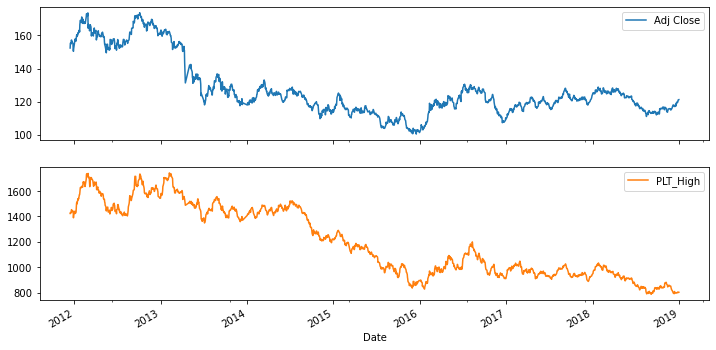

<Figure size 864x432 with 0 Axes>

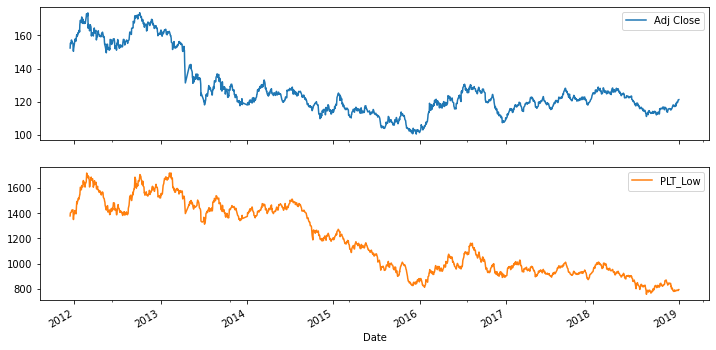

<Figure size 864x432 with 0 Axes>

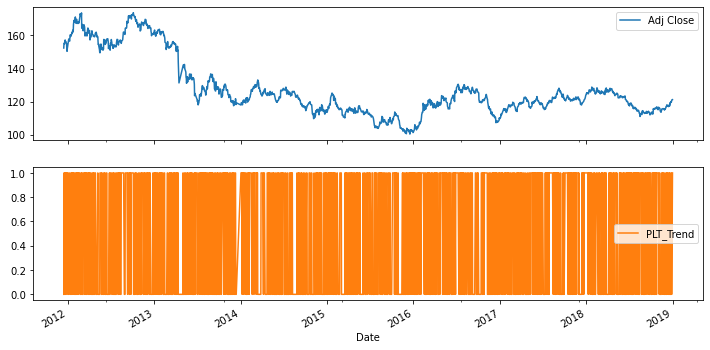

<Figure size 864x432 with 0 Axes>

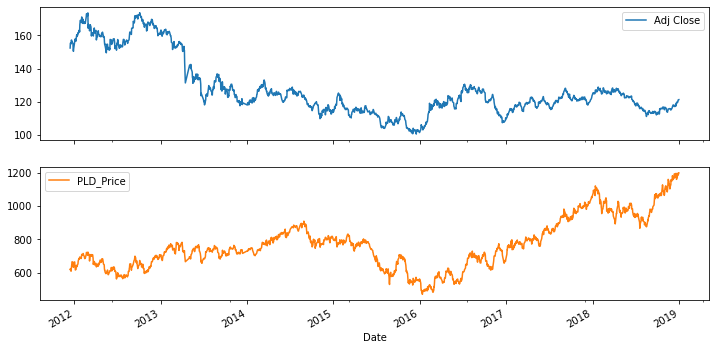

<Figure size 864x432 with 0 Axes>

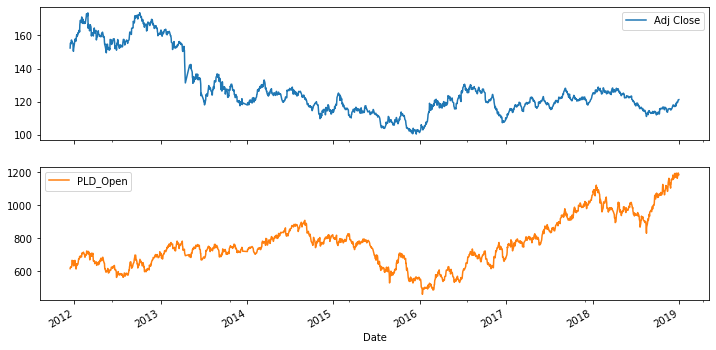

<Figure size 864x432 with 0 Axes>

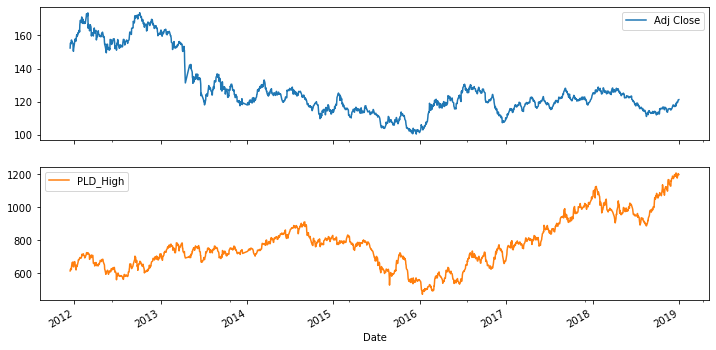

<Figure size 864x432 with 0 Axes>

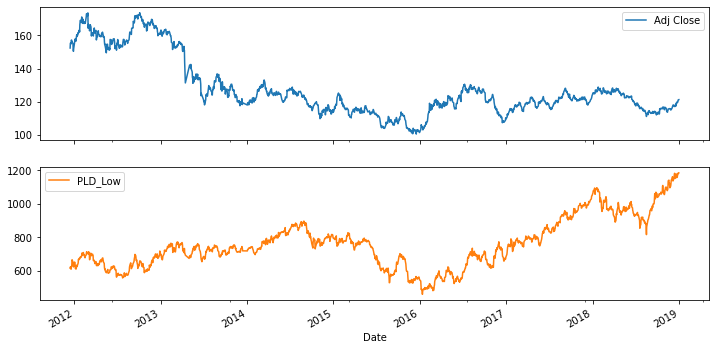

<Figure size 864x432 with 0 Axes>

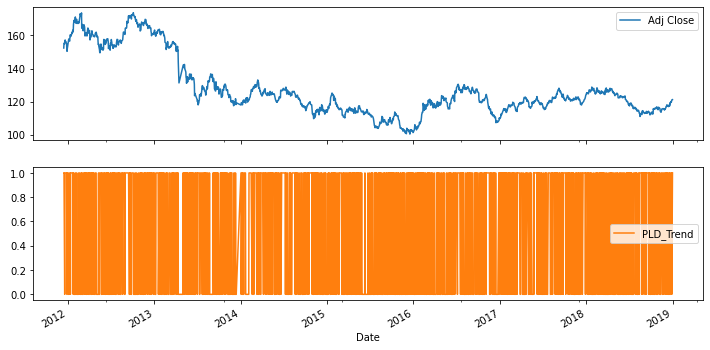

<Figure size 864x432 with 0 Axes>

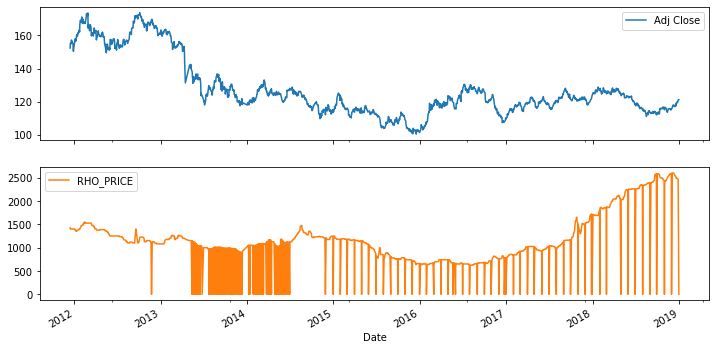

<Figure size 864x432 with 0 Axes>

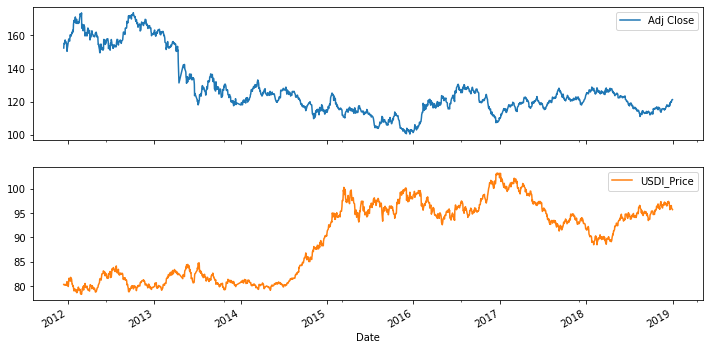

<Figure size 864x432 with 0 Axes>

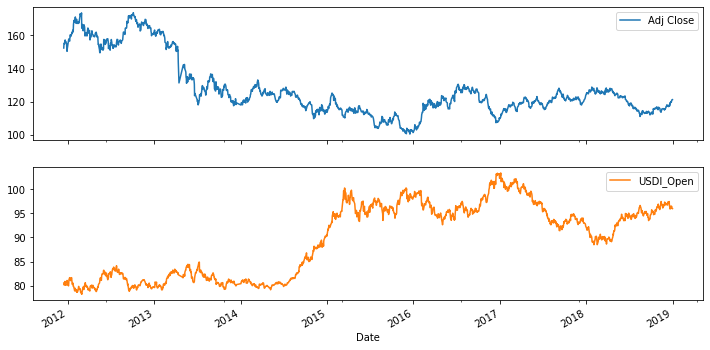

<Figure size 864x432 with 0 Axes>

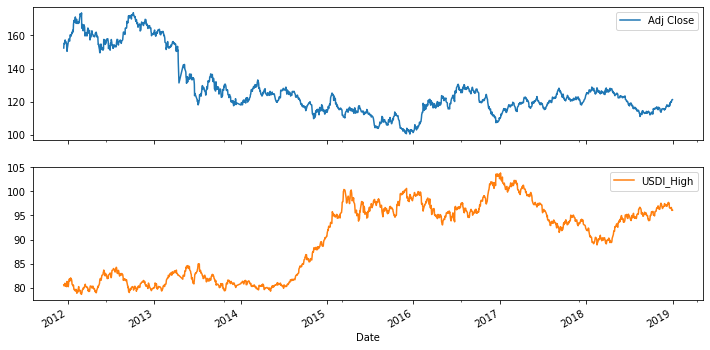

<Figure size 864x432 with 0 Axes>

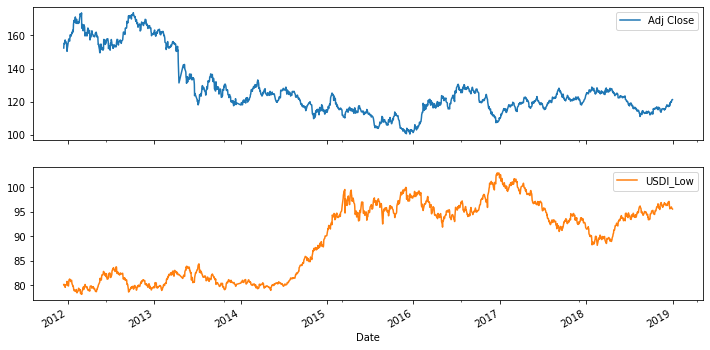

<Figure size 864x432 with 0 Axes>

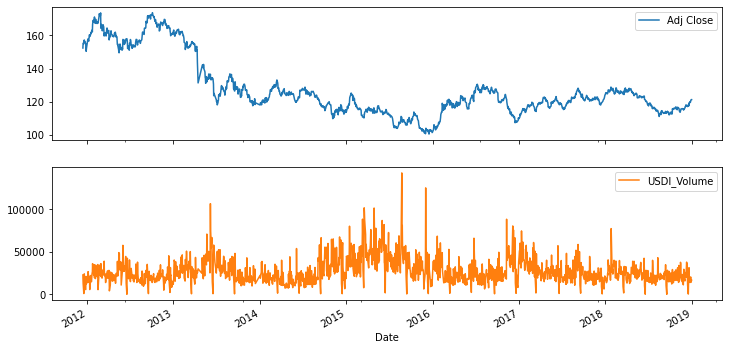

<Figure size 864x432 with 0 Axes>

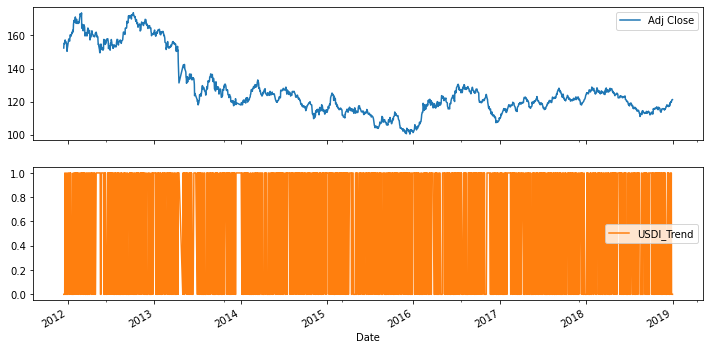

<Figure size 864x432 with 0 Axes>

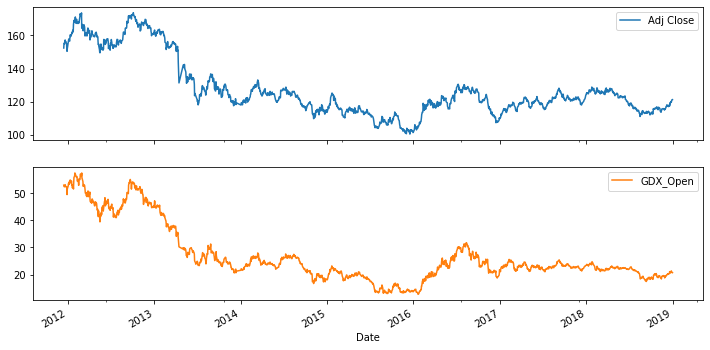

<Figure size 864x432 with 0 Axes>

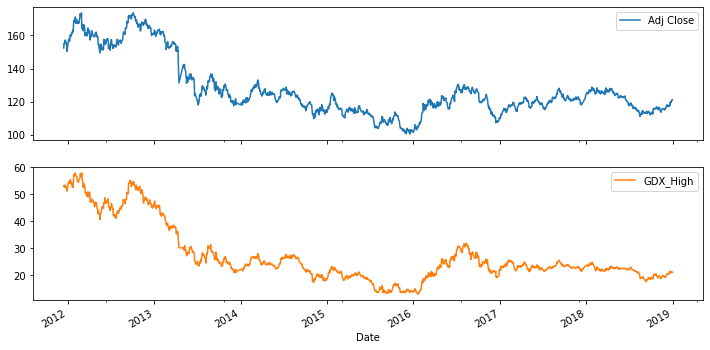

<Figure size 864x432 with 0 Axes>

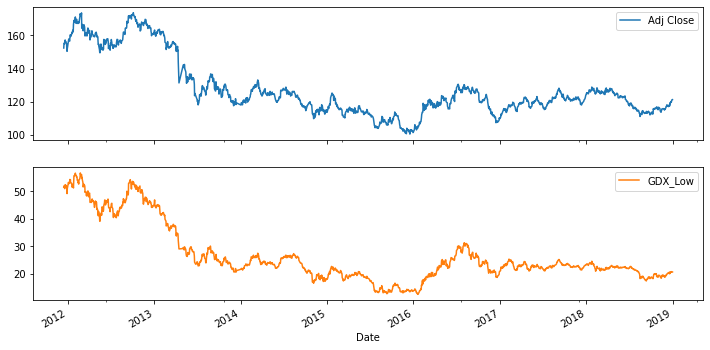

<Figure size 864x432 with 0 Axes>

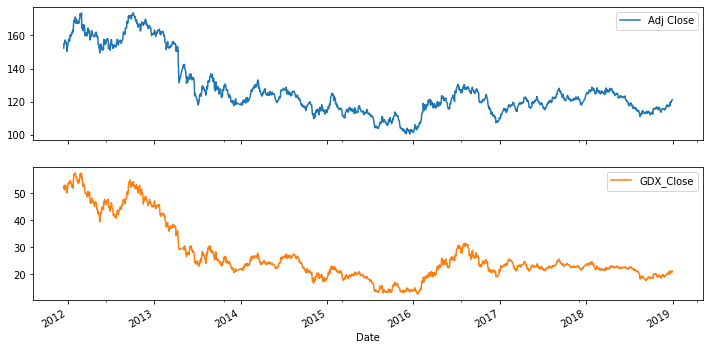

<Figure size 864x432 with 0 Axes>

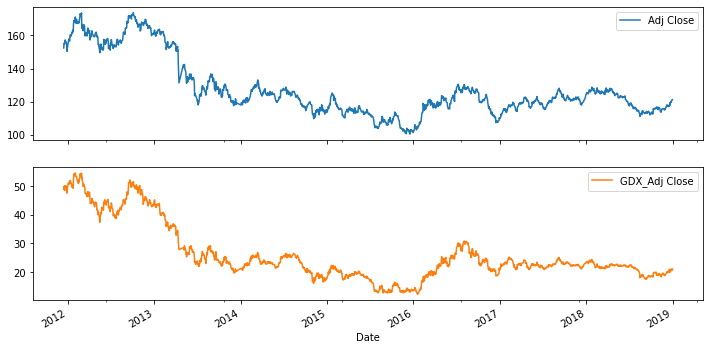

<Figure size 864x432 with 0 Axes>

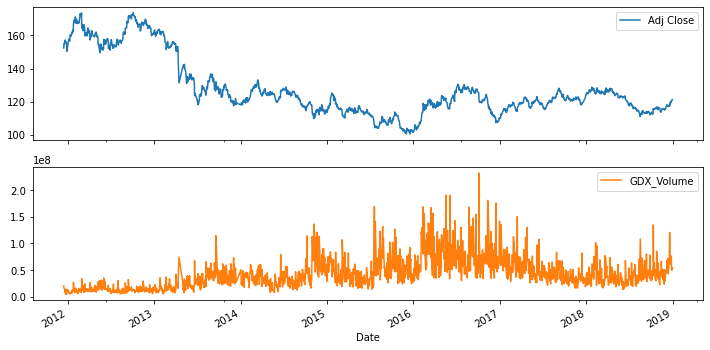

<Figure size 864x432 with 0 Axes>

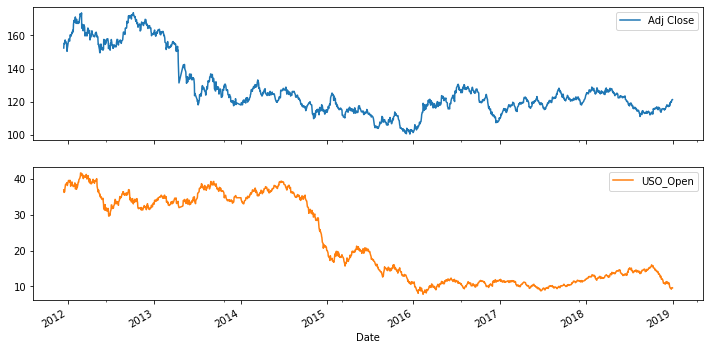

<Figure size 864x432 with 0 Axes>

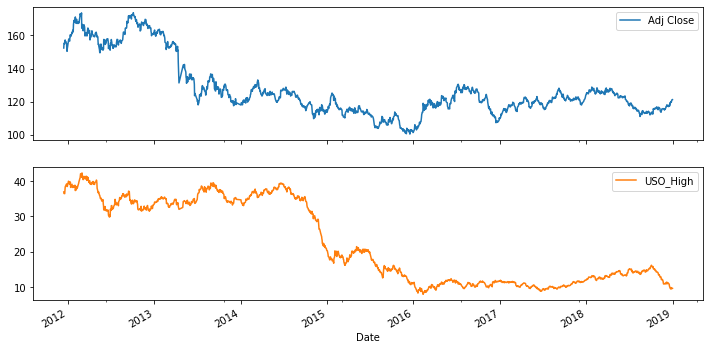

<Figure size 864x432 with 0 Axes>

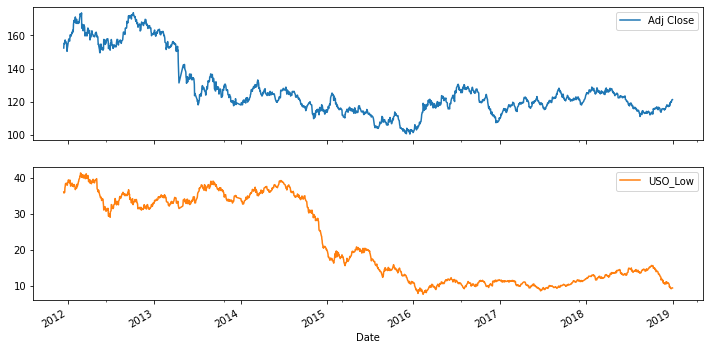

<Figure size 864x432 with 0 Axes>

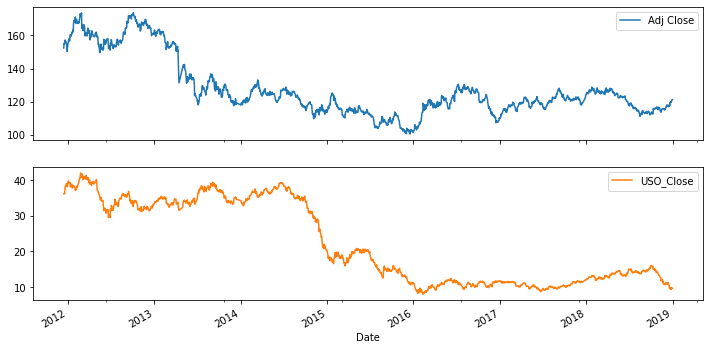

<Figure size 864x432 with 0 Axes>

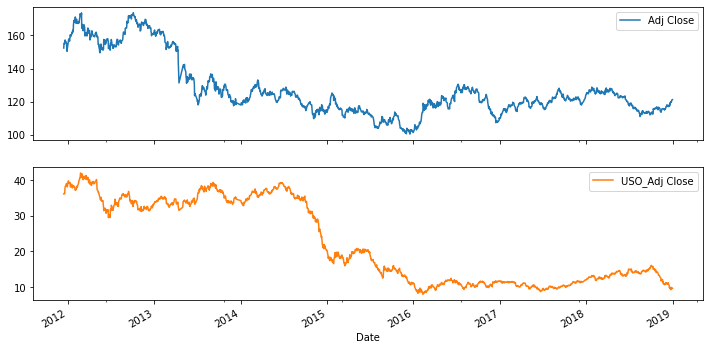

<Figure size 864x432 with 0 Axes>

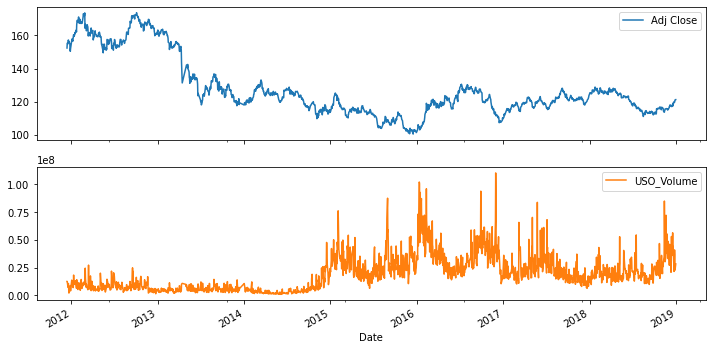

In [18]:
for col in df.columns:     
    plt.figure(figsize=(12,6))     
    df[['Adj Close',col]].plot.line(subplots=True, figsize=(12, 6))     
    #plt.savefig(f'figures/AdjClose{col}.png', dpi=200)     plt.show()

Interpretation

-  Les données historiques de Gold ETF extraites de Yahoo finance ont sensiblement  les memes tendances ce qui justifierait une liaison entre les variables ouverture,hausse,baisse et fermeture du cours de l'or et le cours ajusté de l'or.Par contre le volume a tendance assez differentes durant toute l'evolution de  l'or. En effet , le volume est au depart assez constante de 2012 jusqu'en 2015.De là, la tendance est passé brusquement a la hausse  avec des pics important en 2016 et 2017.


-  globalement,la tendance des differents volume du jeu de données ne suivent pas la meme tendance avec la colture ajusté de l'or

-  les variables relatives à l'indice S&P 500 sont à la hausse avec la meme allure tandis que celle de la cloture ajusté passe à la baisse 

-  les variables relatives à  l'indice Dow Jones, se presentent  sur  une evolution haussière tandis que celle de la cloture ajusté passe à la baisse 
 
-  les variable du taux de change EUR USD ont pratiquement la meme allure avec la variable cible sauf dans la période allant de 2014 à 2015 où la cloture ajusté de l'or a baissé tandis que le taux d'échange augmentait.


<Figure size 1080x792 with 0 Axes>

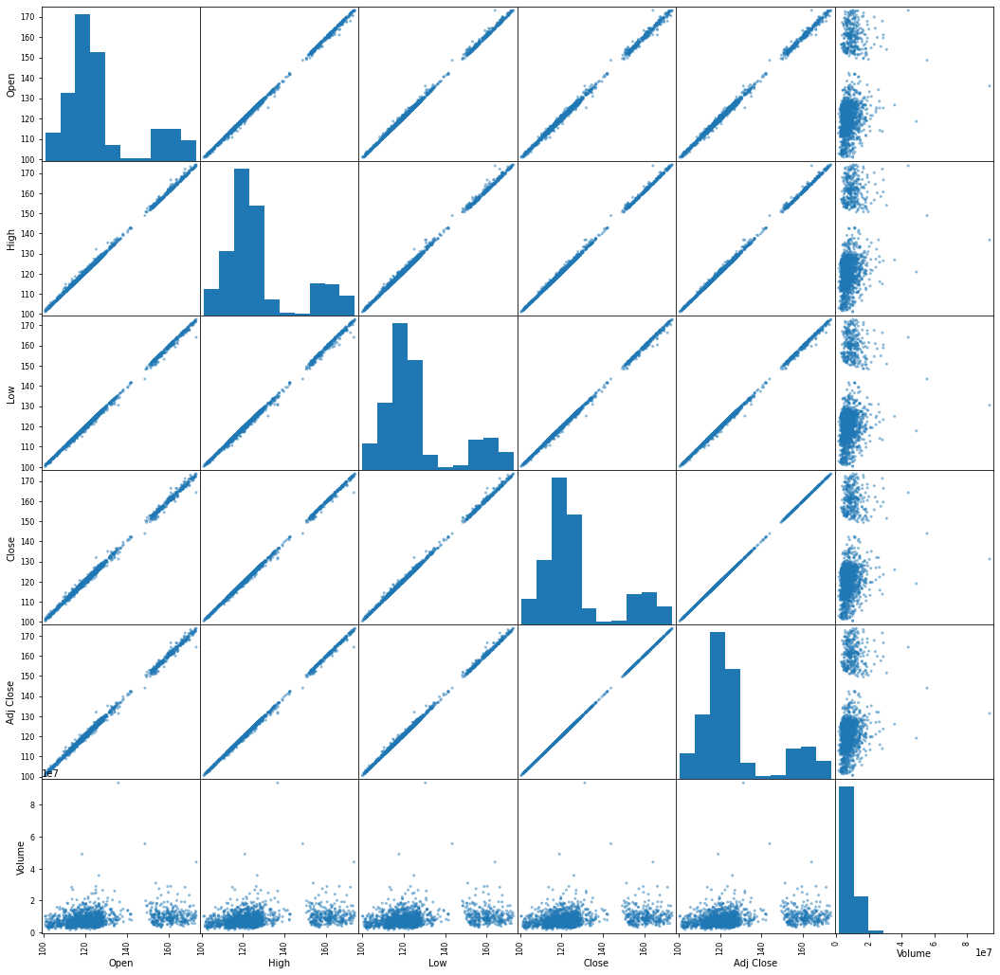

In [19]:
data_etf=data[['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']]
plt.figure(figsize=(15,11))
pd.plotting.scatter_matrix(data_etf.select_dtypes(exclude=['object']),figsize=(18,18));

-   correlation entre les features et la variable cible

In [20]:
X=df.drop(['Adj Close'],axis=1)
X=X.drop(['Close'],axis=1)

<AxesSubplot:title={'center':'Correlation with Adj Close'}>

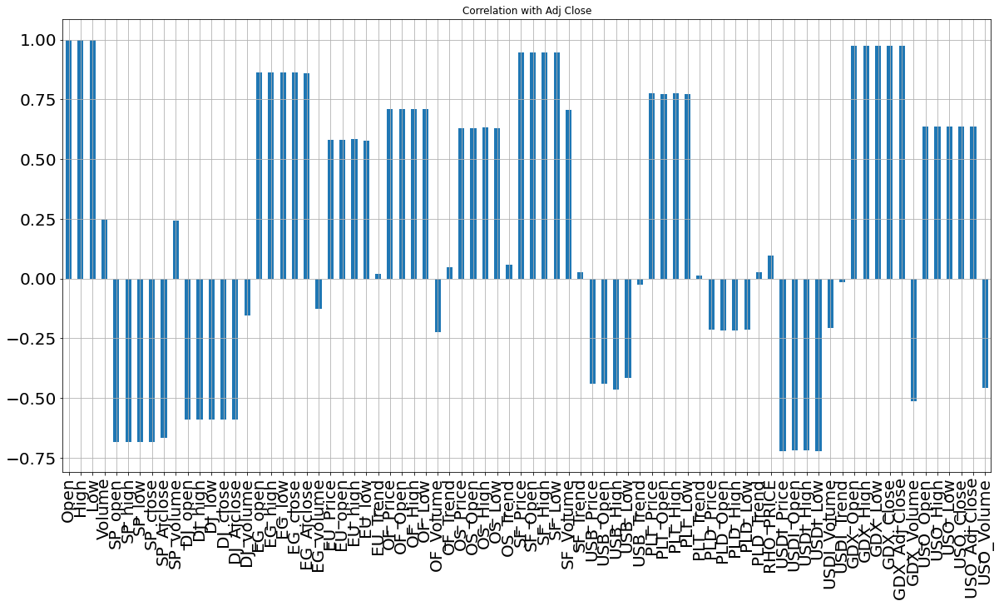

In [21]:
X.corrwith(df['Adj Close']).plot.bar(
        figsize = (20, 10), title = "Correlation with Adj Close", fontsize = 20,
        rot = 90, grid = True)

-  Les variables qui sont correlées positivement à la variable cible

       - Les données historiques de Gold ETF extraites de Yahoo finance (Open, High, Low, Close, Volume)
                  
       - Eldorado Gold Corporation (EGO)(EG_open', 'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume)
       
       - taux de change EUR USD (EUPrice', 'EUopen', 'EUhigh', ' EUlow', 'EUTrend')
       
       - contrats à terme sur le pétrole('OFPrice', 'OFOpen', 'OFHigh', 'OFLow', 'OFTrend)
       
       - pétrole brut WTI USD('OSPrice', 'OSOpen', ' OSHigh', 'OSLow', 'OSTrend'
       
       - Silver Futures('SFPrice', 'SFOpen', 'SFHigh', 'SFlow', 'SFVolume')
       
       - Prix du platine ('PLT_Price', 'PLT_Open', 'PLT_High', 'PLT_Low')
       
       - l'ETF Gold Miners(GDX_Open', 'GDX_High', 'GDX_Low', 'GDX_Close', 'GDX_Adj Close')
       
       - l'ETF pétrolier USO('USO_High', 'USO_Low','USO_Open', 'USO_Close', 'USO_Adj Close')
       
       - SP_volume


- Les variables qui sont correlées négativement à la variable cible
 
      -  l'indice S&P 500('SP_open','SP_high', 'SP_low', 'SP_close', 'SP_Ajclose', 'SP_volume'), 
      -  l'indice Dow Jones('DJ_open','DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume')
      -  données de taux des obligations américaines('USB_Price', 'USB_Open', 'USB_High','USB_Low') 
      -  prix du palladium('PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low') 
      -  prix de l'indice du dollar américain('USDI_Price', 'USDI_Open', 'USDI_High','USDI_Low','USDI_Volume')   
      - GDX_volume (ETF Gold Miners)
      - USO_volume(l'ETF pétrolier USO)
      - OFVolume (contrats à terme sur le pétrole)
      - USDI_volume

In [22]:
corr_matrix=df.corr()
coef=corr_matrix["Adj Close"].sort_values(ascending=False)

In [23]:
#variables positivement corrélées avec la variable cible

pos_corr=coef[coef>0]
pos_corr

Adj Close        1.000000
Close            1.000000
High             0.999535
Low              0.999532
Open             0.998976
GDX_Low          0.975561
GDX_Close        0.975459
GDX_High         0.975255
GDX_Adj Close    0.974980
GDX_Open         0.974824
SF_Low           0.947842
SF_Price         0.947420
SF_Open          0.945557
SF_High          0.945203
EG_low           0.863917
EG_open          0.862900
EG_close         0.862770
EG_high          0.861479
EG_Ajclose       0.859850
PLT_Price        0.775861
PLT_High         0.775481
PLT_Low          0.773993
PLT_Open         0.773760
OF_High          0.711334
OF_Price         0.710693
OF_Open          0.709096
OF_Low           0.708266
SF_Volume        0.706505
USO_Adj Close    0.635675
USO_Close        0.635675
USO_High         0.635311
USO_Open         0.635197
USO_Low          0.634732
OS_High          0.632001
OS_Price         0.630817
OS_Open          0.630046
OS_Low           0.629083
EU_high          0.582969
EU_Price    

In [24]:
#variables negativement corrélées  avec la variable cible

neg_corr=coef[coef<0]
neg_corr

USDI_Trend    -0.016641
USB_Trend     -0.025933
EG_volume     -0.126586
DJ_volume     -0.155526
USDI_Volume   -0.205954
PLD_Price     -0.213179
PLD_Low       -0.214919
PLD_Open      -0.216426
PLD_High      -0.217490
OF_Volume     -0.225436
USB_Low       -0.417352
USB_Open      -0.440822
USB_Price     -0.441347
USO_Volume    -0.456193
USB_High      -0.464116
GDX_Volume    -0.514616
DJ_low        -0.588157
DJ_close      -0.588411
DJ_Ajclose    -0.588411
DJ_high       -0.588778
DJ_open       -0.588800
SP_Ajclose    -0.666071
SP_low        -0.683750
SP_close      -0.684284
SP_open       -0.684618
SP_high       -0.684904
USDI_High     -0.720023
USDI_Open     -0.720140
USDI_Price    -0.721569
USDI_Low      -0.722078
Name: Adj Close, dtype: float64

In [25]:
# Selection des variables dont le coef de correlation avec la valeur cible est superieur à  0.2 en valeur absolue

var1=coef[(coef>0.2)|(coef<-0.2)]
var1

Adj Close     1.000000
Close         1.000000
High          0.999535
Low           0.999532
Open          0.998976
                ...   
SP_high      -0.684904
USDI_High    -0.720023
USDI_Open    -0.720140
USDI_Price   -0.721569
USDI_Low     -0.722078
Name: Adj Close, Length: 69, dtype: float64

h. Identification des données extremes

In [26]:
scaler=RobustScaler()
dtaframe=df
db=scaler.fit_transform(dtaframe)
db=pd.DataFrame(db,columns=dtaframe.columns,index=dtaframe.index)

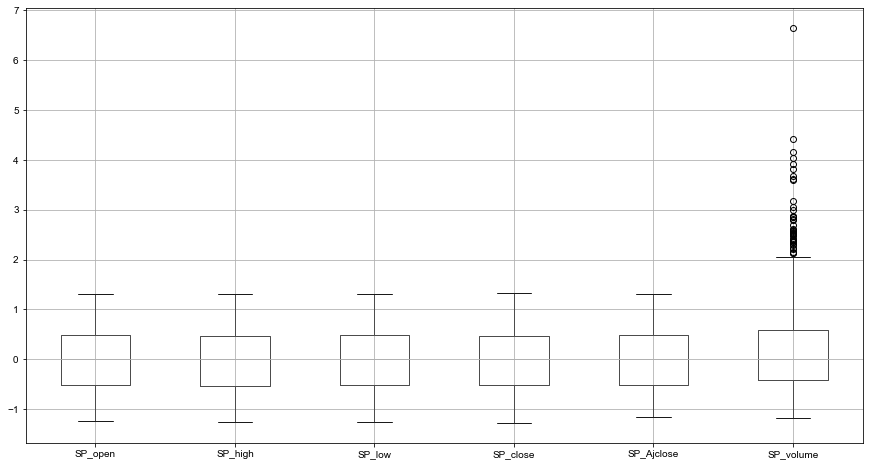

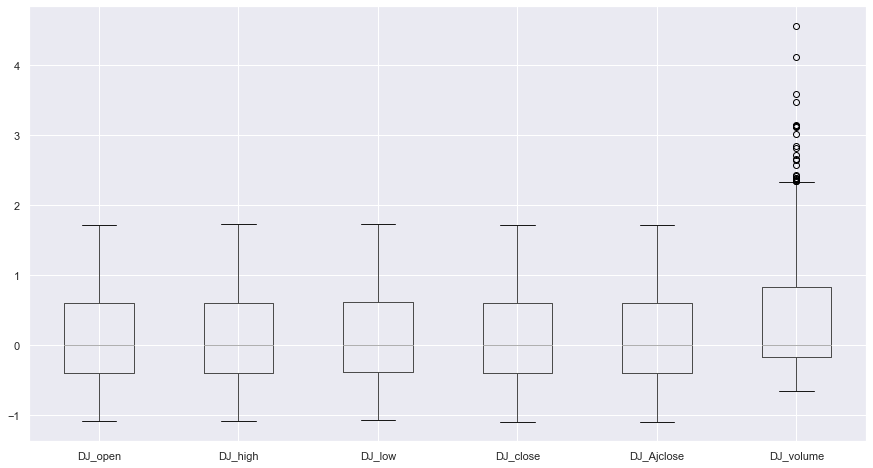

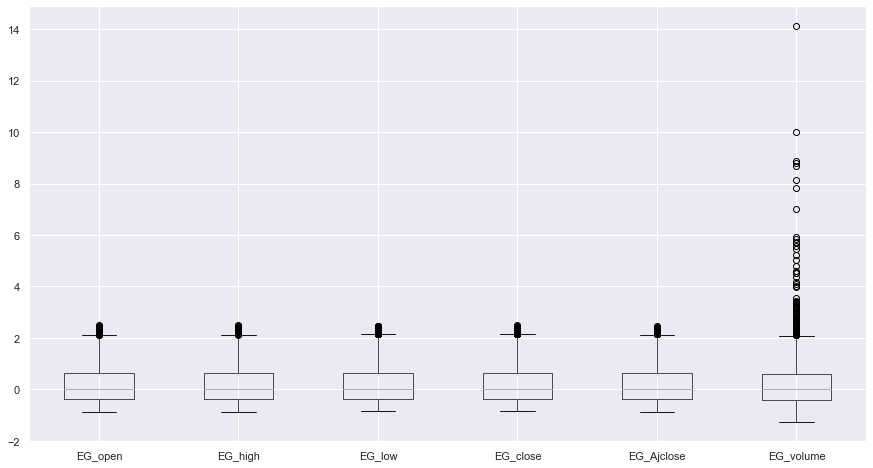

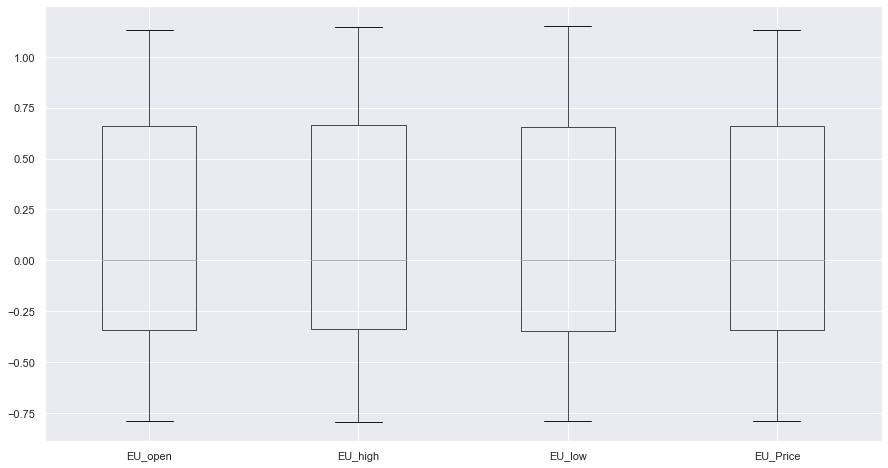

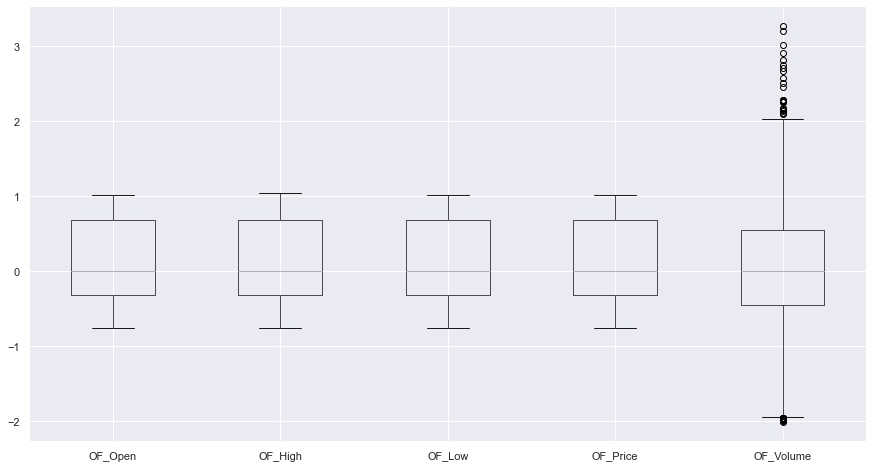

...

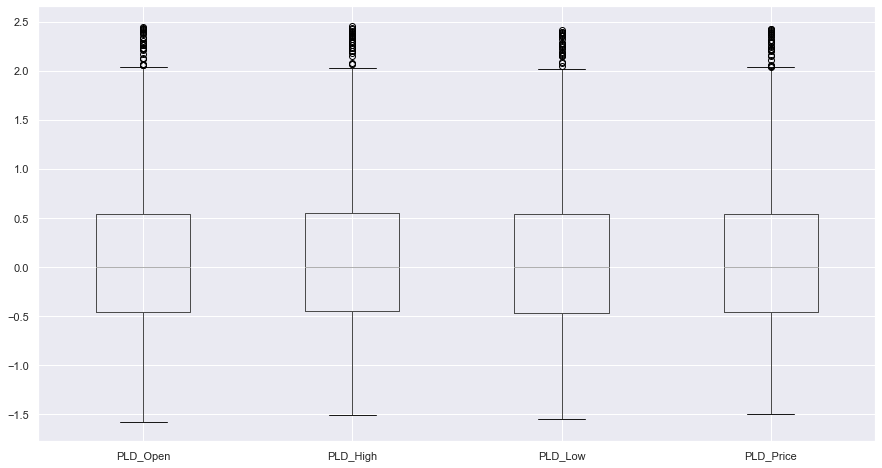

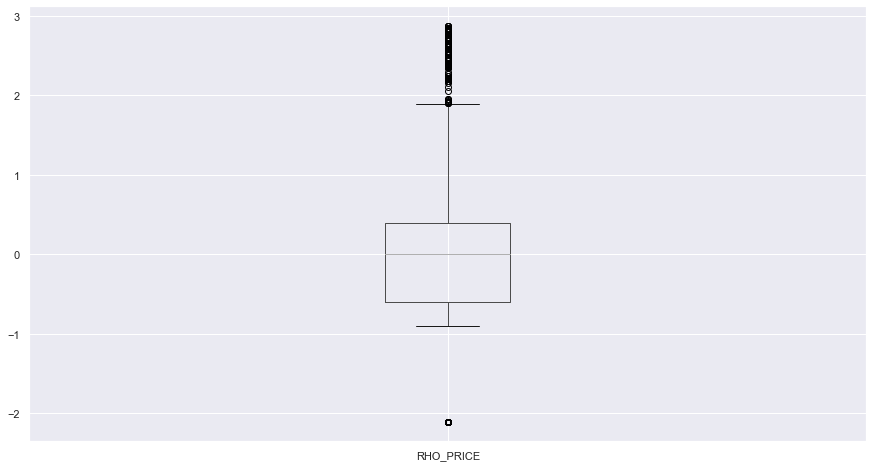

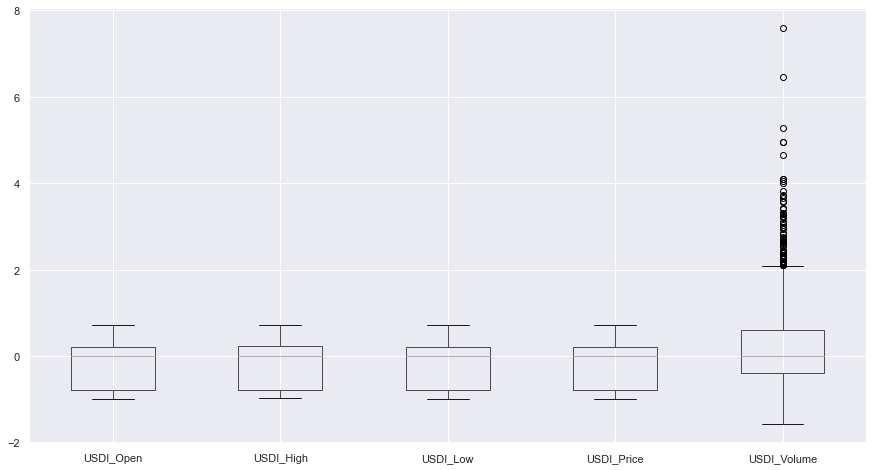

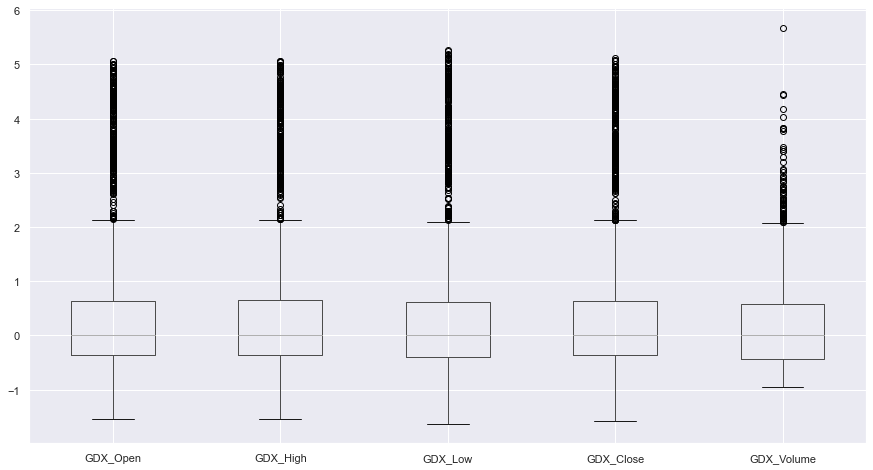

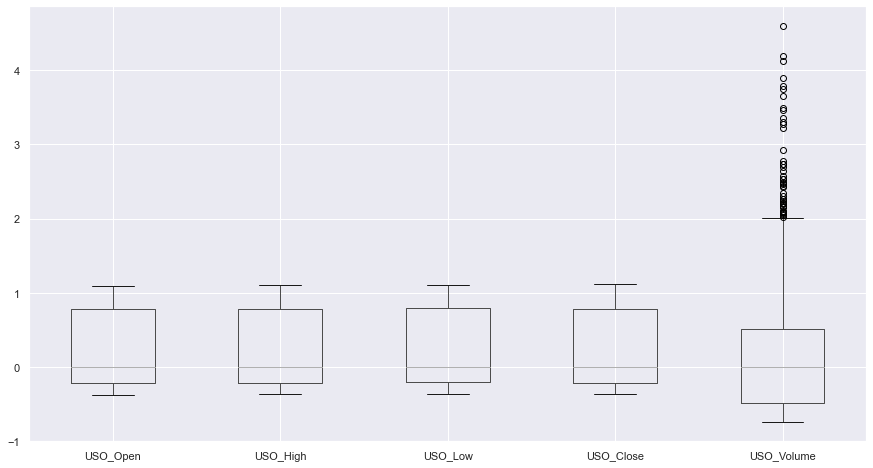

In [27]:
for indicator in ['SP_','DJ_','EG_','EU_','OF_','OS_','SF_','USB_','PLT_','PLD_','RHO_','USDI_','GDX_','USO_']:
    fig, ax = plt.subplots(figsize=(15, 8), nrows=1, ncols=1)
    sns.set(style='darkgrid')
    liste=[]
    for value in ['open','high','low','close','Ajclose','price','trend','Open','High','Low','Close','ajclose','Price','PRICE','volume','Volume']:
        var = indicator+value
        if var in db.columns.drop('Adj Close'):
            liste.append(var)         
    db[liste].boxplot()

In [28]:
#fonction de récupérations des outliers
def outliers(x):
    Q1 = np.quantile(x, 0.25)
    Q3 = np.quantile(x, 0.75)
    EIQ = Q3 - Q1
    LI = Q1 -(EIQ*1.5)
    LS = Q3 + (EIQ*1.5)
    i = x.index[(x < LI) | (x > LS)]
    val = x[i]
    return i,val

In [29]:
 listing=['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume',
       'SP_open', 'SP_high', 'SP_low', 'SP_close', 'SP_Ajclose', 'SP_volume',
       'DJ_open', 'DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume',
       'EG_open', 'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume',
       'EU_Price', 'EU_open', 'EU_high', 'EU_low', 'EU_Trend', 'OF_Price',
       'OF_Open', 'OF_High', 'OF_Low', 'OF_Volume', 'OF_Trend', 'OS_Price',
       'OS_Open', 'OS_High', 'OS_Low', 'OS_Trend', 'SF_Price', 'SF_Open',
       'SF_High', 'SF_Low', 'SF_Volume', 'SF_Trend', 'USB_Price', 'USB_Open',
       'USB_High', 'USB_Low', 'USB_Trend', 'PLT_Price', 'PLT_Open', 'PLT_High',
       'PLT_Low', 'PLT_Trend', 'PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low',
       'PLD_Trend', 'RHO_PRICE', 'USDI_Price', 'USDI_Open', 'USDI_High',
       'USDI_Low', 'USDI_Volume', 'USDI_Trend', 'GDX_Open', 'GDX_High',
       'GDX_Low', 'GDX_Close', 'GDX_Adj Close', 'GDX_Volume', 'USO_Open',
       'USO_High', 'USO_Low', 'USO_Close', 'USO_Adj Close', 'USO_Volume']
   

In [30]:
 for i in  listing:
        print(outliers(df[i]))

(DatetimeIndex(['2011-12-15', '2011-12-16', '2011-12-19', '2011-12-20',
               '2011-12-21', '2011-12-22', '2011-12-23', '2011-12-27',
               '2011-12-28', '2011-12-29',
               ...
               '2013-04-01', '2013-04-02', '2013-04-03', '2013-04-04',
               '2013-04-05', '2013-04-08', '2013-04-09', '2013-04-10',
               '2013-04-11', '2013-04-12'],
              dtype='datetime64[ns]', name='Date', length=326, freq=None), Date
2011-12-15    154.740005
2011-12-16    154.309998
2011-12-19    155.479996
2011-12-20    156.820007
2011-12-21    156.979996
                 ...    
2013-04-08    152.389999
2013-04-09    152.320007
2013-04-10    152.669998
2013-04-11    150.759995
2013-04-12    148.649994
Name: Open, Length: 326, dtype: float64)
(DatetimeIndex(['2011-12-15', '2011-12-16', '2011-12-19', '2011-12-20',
               '2011-12-21', '2011-12-22', '2011-12-23', '2011-12-27',
               '2011-12-28', '2011-12-29',
               ...
        

In [31]:
def valeurAberante(data):
    percentage = {}
    for col in data:
        Q1 = np.quantile(data[col],0.25)
        Q3 = np.quantile(data[col],0.75)
        IIQ = Q3 - Q1
        bornInf = Q1-1.5*IIQ
        bornSup = Q3+1.5*IIQ
        abberantVal = []
        for i in df[col]:
            if bornInf <= i <= bornSup :
                pass
            else:
                abberantVal.append(i)
                percent = len(abberantVal)*100/1718
                percentage[col] = percent
    return percentage

In [32]:
valeurAberante(df)

{'Open': 18.975552968568103,
 'High': 18.975552968568103,
 'Low': 18.917345750873107,
 'Close': 18.917345750873107,
 'Adj Close': 18.917345750873107,
 'Volume': 3.783469150174622,
 'SP_volume': 2.4447031431897557,
 'DJ_volume': 1.4551804423748544,
 'EG_open': 4.307334109429569,
 'EG_high': 4.2491268917345755,
 'EG_low': 4.074505238649593,
 'EG_close': 3.89988358556461,
 'EG_Ajclose': 2.9685681024447033,
 'EG_volume': 5.064027939464494,
 'OF_Volume': 2.3864959254947613,
 'SF_Price': 4.2491268917345755,
 'SF_Open': 3.958090803259604,
 'SF_High': 3.608847497089639,
 'SF_Low': 4.190919674039581,
 'SF_Volume': 13.620488940628638,
 'PLD_Price': 1.6880093131548313,
 'PLD_Open': 1.6880093131548313,
 'PLD_High': 1.6880093131548313,
 'PLD_Low': 1.5133876600698486,
 'RHO_PRICE': 16.82188591385332,
 'USDI_Volume': 4.481955762514552,
 'GDX_Open': 17.57857974388824,
 'GDX_High': 17.69499417927823,
 'GDX_Low': 18.21885913853318,
 'GDX_Close': 17.81140861466822,
 'GDX_Adj Close': 17.81140861466822,
 '

 on observe plus de données extrêmes au niveau des variables:

-  données historiques de Gold ETF extraites de Yahoo finance (19%) 

-  de l'ETF Gold Miners (18%)

Resumé: Au vu des correlations et des allures de l'evolution des differentes variables.IL nouys semble judicieux de considerer pour la modelisation les variables suivantes:

USDI_Volume,PLD_Price,PLD_Low,PLD_Open,PLD_High,OF_Volume,USB_Low,USB_Open,USB_Price,USO_Volume,USB_High,GDX_Volume,DJ_low  DJ_close,DJ_Ajclose ,DJ_high, DJ_open, SP_Ajclose, SP_low, SP_close, SP_open, SP_high,USDI_High,USDI_Open,USDI_Price    USDI_Low      

2.PREDICTION 

-   Preprocessing

In [33]:
# Séparation du jeu de données en entrainement et en test suivant les variables selectionnées

In [34]:
feature_columns=['USDI_Volume','PLD_Price','PLD_Low','PLD_Open','PLD_High','OF_Volume','USB_Low','USB_Open','USB_Price','USO_Volume','USB_High','GDX_Volume','DJ_low','DJ_close','DJ_Ajclose','DJ_high','DJ_open','SP_Ajclose','SP_low','SP_close','SP_open','SP_high','USDI_High','USDI_Open','USDI_Price','USDI_Low']

In [35]:
data=df[['USDI_Volume','PLD_Price','PLD_Low','PLD_Open','PLD_High','OF_Volume','USB_Low','USB_Open','USB_Price','USO_Volume','USB_High','GDX_Volume','DJ_low','DJ_close','DJ_Ajclose','DJ_high','DJ_open','SP_Ajclose','SP_low','SP_close','SP_open','SP_high','USDI_High','USDI_Open','USDI_Price','USDI_Low','Adj Close']]

In [36]:
data

,USDI_Volume,PLD_Price,PLD_Low,PLD_Open,PLD_High,OF_Volume,USB_Low,USB_Open,USB_Price,USO_Volume,USB_High,GDX_Volume,DJ_low,DJ_close,DJ_Ajclose,DJ_high,DJ_open,SP_Ajclose,SP_low,SP_close,SP_open,SP_high,USDI_High,USDI_Open,USDI_Price,USDI_Low,Adj Close
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-15,22850,618.85,614.60,614.70,615.00,14330,1.911,1.911,1.911,12616700,1.911,20605600,11825.21973,11868.80957,11868.80957,11967.83984,11825.29004,105.441238,121.989998,122.180000,123.029999,123.199997,80.630,80.565,80.341,80.130,152.330002
2011-12-16,13150,623.65,622.30,622.60,623.45,140080,1.851,1.851,1.851,12578800,1.851,16285400,11819.30957,11866.38965,11866.38965,11968.17969,11870.25000,105.597549,121.300003,121.589996,122.230003,122.949997,80.395,80.175,80.249,79.935,155.229996
2011-12-19,970,608.80,608.60,626.00,630.00,147880,1.810,1.810,1.810,7418200,1.810,15120200,11735.19043,11766.25977,11766.25977,11925.87988,11866.54004,104.468536,120.029999,120.290001,122.059998,122.320000,80.470,80.300,80.207,80.125,154.869995
2011-12-20,22950,626.65,622.45,622.45,622.45,170240,1.927,1.927,1.927,10041600,1.927,11644900,11768.83008,12103.58008,12103.58008,12117.12988,11769.20996,107.629784,120.370003,123.930000,122.180000,124.139999,80.940,80.890,80.273,80.035,156.979996
2011-12-21,24140,635.90,623.80,625.70,641.50,145090,1.970,1.970,1.970,10728000,1.970,8724300,11999.44043,12107.74023,12107.74023,12119.70020,12103.58008,107.838242,122.750000,124.169998,123.930000,124.360001,80.445,80.105,80.350,79.550,157.160004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,13930,1172.80,1157.90,1163.40,1177.60,76220,2.733,2.826,2.736,21598200,2.826,60507000,21792.19922,21792.19922,21792.19922,22339.86914,22317.27930,234.339996,234.270004,234.339996,239.039993,240.839996,96.440,96.440,96.007,95.870,120.019997
2018-12-26,15660,1190.10,1175.50,1176.00,1191.00,77000,2.720,2.751,2.810,40978800,2.815,76365200,21712.52930,22878.44922,22878.44922,22878.91992,21857.73047,246.179993,233.759995,246.179993,235.970001,246.179993,96.650,96.100,96.568,96.020,119.660004
2018-12-27,20520,1196.00,1181.50,1190.05,1198.40,102590,2.733,2.803,2.774,36578700,2.806,52393000,22267.41992,23138.82031,23138.82031,23138.89063,22629.06055,248.070007,238.960007,248.070007,242.570007,248.289993,96.495,96.460,96.001,95.935,120.570000


In [37]:
data_train,data_test= train_test_split(data,test_size = 0.3, random_state=1)

*   Normalisation

In [38]:
scaler=RobustScaler()

In [39]:
df_train=scaler.fit_transform(data_train)

In [40]:
df_train=pd.DataFrame(df_train,columns=data_train.columns,index=data_train.index)

In [41]:
df_test=scaler.transform(data_test)

In [42]:
df_test=pd.DataFrame(df_test,columns=data_test.columns,index=data_test.index)

In [43]:
#Fonction de normalisation

def normaliser(data_train,data_test):
    
    scaler=RobustScaler()
    
    df_train=scaler.fit_transform(data_train)
    df_train=pd.DataFrame(df_train,columns=data_train.columns,index=data_train.index)
    
    df_test=scaler.transform(data_test)
    df_test=pd.DataFrame(df_test,columns=data_test.columns,index=data_test.index)
    
    return df_train, df_test

-    separation du target et des  features

In [44]:
## Données d'entrainement

In [45]:
X_train=df_train.drop('Adj Close', axis=1)

In [46]:
y_train=df_train['Adj Close']

In [47]:
##données de test

In [48]:
X_test=df_test.drop('Adj Close', axis=1)

In [49]:
y_test=df_test['Adj Close']

In [50]:
# fonction  de separation de la variable cible avec les predicteurs

In [51]:
def cat_target(dataset,target):
    X=dataset.drop(target, axis=1)
    y=dataset[target]
    return X, y

In [52]:
X_train,y_train=cat_target(df_train,'Adj Close')

In [53]:
X_test,y_test=cat_target(df_test,'Adj Close')

In [54]:
X_train.shape

(1202, 26)

In [55]:
y_train.shape

(1202,)

In [56]:
X_test.shape

(516, 26)

In [57]:
y_test.shape

(516,)

#  Modelisation

In [58]:
dt  = DecisionTreeRegressor(random_state=0)
svr = SVR(kernel='linear')
rf  = RandomForestRegressor(n_estimators=50, random_state=0)
lasso=LassoCV(n_alphas=1000, max_iter=3000, random_state=0)
ridge= RidgeCV(gcv_mode='auto')
KNN  =KNeighborsRegressor()
Lr=LinearRegression()

In [59]:
dict_of_models = {' DecisionTreeRegressor': dt,
                  'SVR' : svr,
                  'RandomForestRegressor': rf,
                  'LassoCV': lasso,
                  'RidgeCV':ridge,
                  'KNeighborsRegressor':KNN,
                  'LinearRegression':Lr
                 }

In [60]:
def evaluation(model):
    
    model.fit(X_train, y_train)
    predicted = model.predict(X_test)
      
    RSME_score = np.sqrt(mean_squared_error(y_test, predicted))
    print('RMSE: ', RSME_score)
    
    mae = mean_absolute_error(y_test, predicted)
    print('MAE: %.3f' % mae)
    
    var_test = y_test.var()
    
    mse = mean_squared_error(y_test,predicted)
    
    Adj_rsquare = 1-(mse/var_test)
    
    print('R^2-adj: ', Adj_rsquare)
       
    R2_score = r2_score(y_test, predicted)
    print('R2 score: ', R2_score)
    
    N, train_score, val_score = learning_curve(model, X_train, y_train,
                                               cv=4,
                                               train_sizes=np.linspace(0.1, 1, 10))
    
    plt.figure(figsize=(12, 5))
    plt.plot(N, train_score.mean(axis=1), label='train')
    plt.plot(N, val_score.mean(axis=1), label='validation')
    plt.title(model, fontsize=24)
    plt.legend()

 DecisionTreeRegressor
RMSE:  0.2289550125683336
MAE: 0.144
R^2-adj:  0.9716616474317924
R2 score:  0.9716066215044754
SVR
RMSE:  0.48003300964121426
MAE: 0.387
R^2-adj:  0.8754291313989008
R2 score:  0.875187246217151
RandomForestRegressor
RMSE:  0.16707335210824922
MAE: 0.113
R^2-adj:  0.9849100201607058
R2 score:  0.984880719228979
LassoCV
RMSE:  0.4647676738221755
MAE: 0.384
R^2-adj:  0.8832260113696834
R2 score:  0.8829992657606924
RidgeCV
RMSE:  0.4579500925770987
MAE: 0.379
R^2-adj:  0.8866267518574179
R2 score:  0.8864066096280148
KNeighborsRegressor
RMSE:  0.23390406999320307
MAE: 0.154
R^2-adj:  0.9704232912676013
R2 score:  0.9703658607652083
LinearRegression
RMSE:  0.4553013132895353
MAE: 0.376
R^2-adj:  0.887934458736255
R2 score:  0.8877168557435098


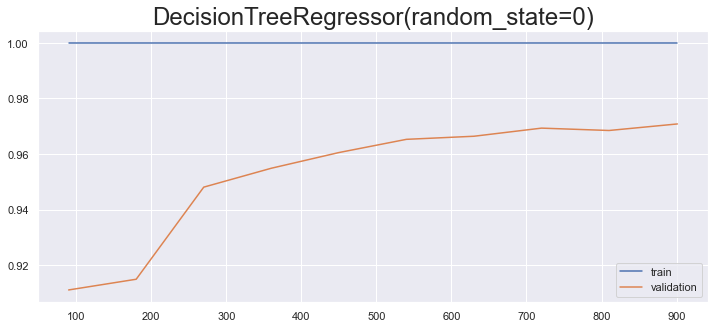

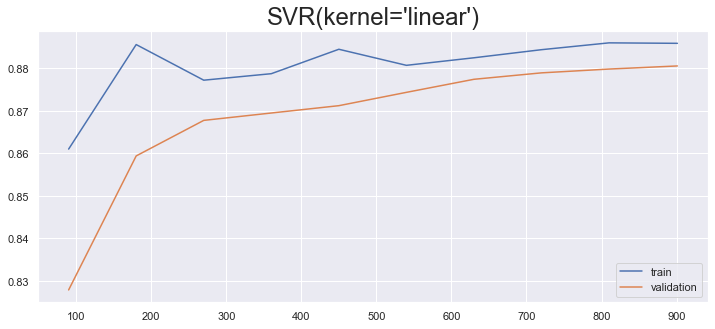

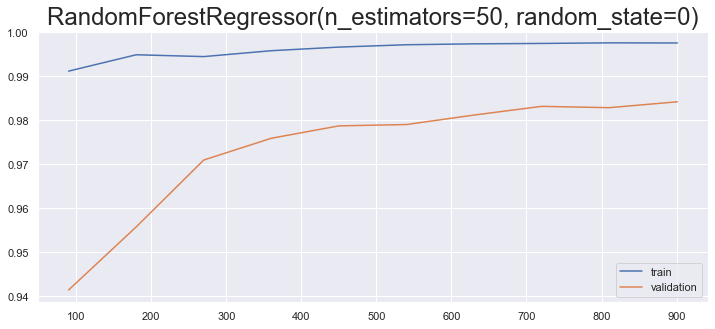

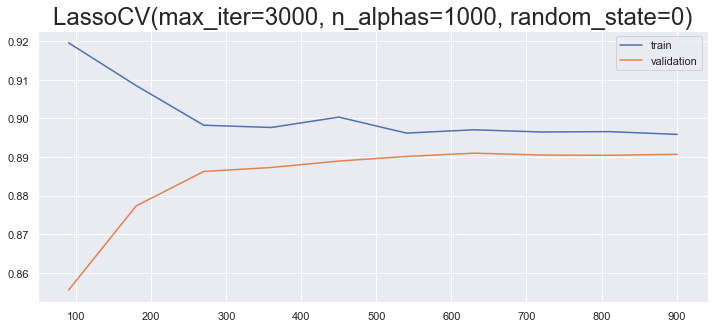

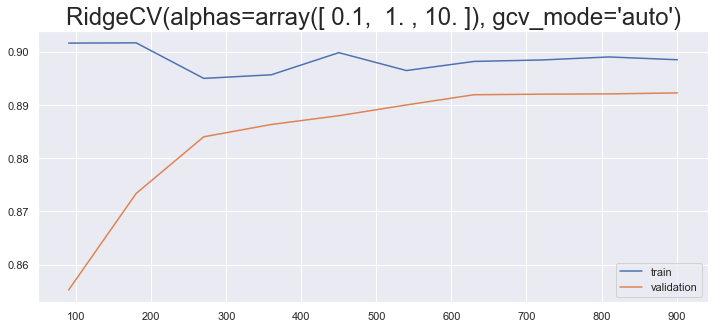

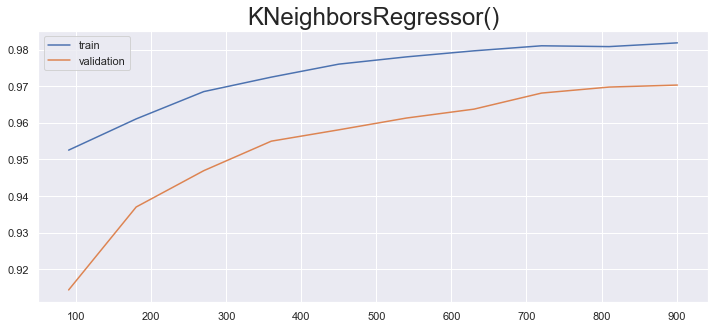

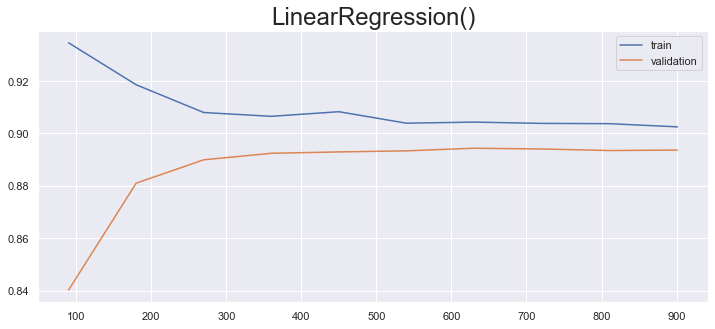

In [61]:
for name, model in dict_of_models.items():
    print(name)
    evaluation(model)

Au vue des performances des différents modeles nous retenons le modele de randonforest. En effet, le modele est assez performant sur la donnée d'entrainement, et s'adapte bien à la donnée test.elle presente une stabilité à partir de 900

#   Optimisation des hyperparamètres du modele choisi

In [62]:
params_RF = {"max_depth": [3,5,6,7,8,9],
              "max_features":['auto', 'sqrt', 'log2'],
              "min_samples_split": [2, 3,5,7],
              "min_samples_leaf": [1, 3,5,6]}

In [63]:
grid=GridSearchCV(rf,params_RF,cv=5)

In [64]:
grid.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=RandomForestRegressor(n_estimators=50, random_state=0),
             param_grid={'max_depth': [3, 5, 6, 7, 8, 9],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 3, 5, 6],
                         'min_samples_split': [2, 3, 5, 7]})

In [65]:
grid.best_params_

{'max_depth': 9,
 'max_features': 'log2',
 'min_samples_leaf': 1,
 'min_samples_split': 2}

In [66]:
best_model=grid.best_estimator_

RMSE:  0.14608375055417008
MAE: 0.107
R^2-adj:  0.9884633927493767
R2 score:  0.9884409915702492


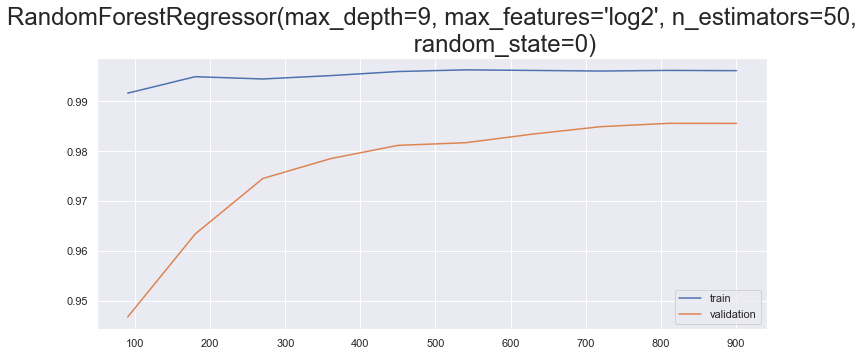

In [67]:
evaluation(best_model)

Le modele de randomforest optimiser nous donne un R-quare de 99%  avec une erreur estimée a 14%

#    Verification des hypotheses de la regression linéaire

In [68]:
best_model

RandomForestRegressor(max_depth=9, max_features='log2', n_estimators=50,
                      random_state=0)

In [69]:
best_model.fit(X_train, y_train)
predicted =best_model.predict(X_test)

In [70]:
x=y_test-predicted

In [71]:
x.sum()

-2.578142181096603

- Normalité des résidus

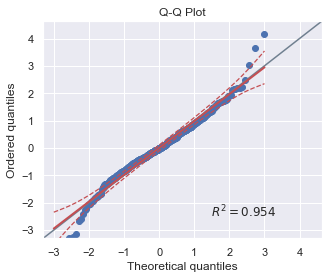

In [72]:
import numpy as np
import pingouin as pg
ax = pg.qqplot(x, dist='norm');

In [73]:
print(pg.normality(x))

                  W          pval  normal
Adj Close  0.958052  5.965796e-11   False


In [74]:
k2, p = stats.normaltest(x)
alpha =0.001
print("p = {:g}".format(p))
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

p = 4.08394e-17
The null hypothesis can be rejected


In [80]:
#sns.distplot(x)

- hypothese d'homoscédacité et de non linéarité

<Figure size 1080x792 with 0 Axes>

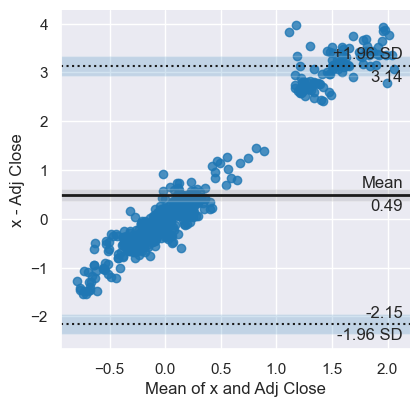

In [76]:
plt.figure(figsize=(15,11))
ax = pg.plot_blandaltman(predicted,x);

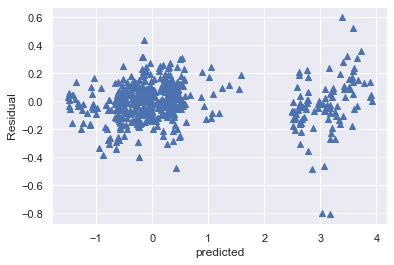

In [77]:
plt.scatter(predicted,x,marker='^')
plt.xlabel("predicted")
plt.ylabel("Residual");

- Vérification de  l'autocorrelation des résidus????

# Analyse des résidus avec le modele de regression

In [81]:
Lr=LinearRegression()

In [83]:
Lr.fit(X_train,y_train)

LinearRegression()

In [84]:
y_pred = Lr.predict(X_test)

In [90]:
#Normalité des résidus?

In [86]:
res=y_test-y_pred

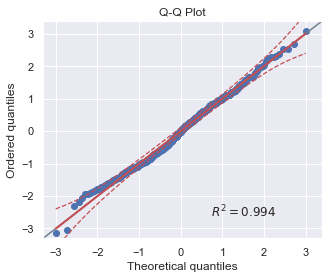

In [87]:
ares = pg.qqplot(res, dist='norm');

In [88]:
print(pg.normality(res))

                  W      pval  normal
Adj Close  0.994005  0.039452   False


<AxesSubplot:xlabel='Adj Close', ylabel='Density'>

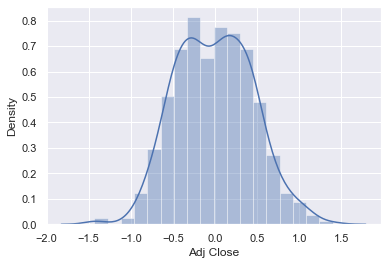

In [89]:
sns.distplot(res)

In [ ]:
#hypothese d'homoscédacité et de linéarité

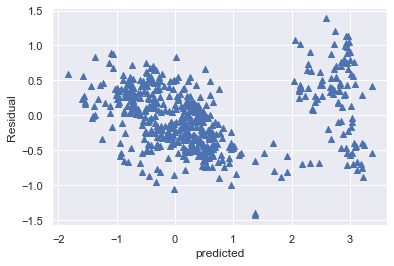

In [91]:
plt.scatter(y_pred,res,marker='^')
plt.xlabel("predicted")
plt.ylabel("Residual");

<Figure size 1080x792 with 0 Axes>

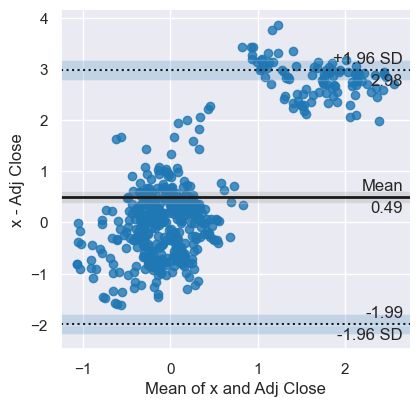

In [92]:
plt.figure(figsize=(15,11))
ares = pg.plot_blandaltman(predicted,res);

In [ ]:
#Non autocorrélation des résidus

In [93]:
#perform Durbin-Watson test

import statsmodels.api as sm

from statsmodels.stats.stattools import durbin_watson

from statsmodels.regression.linear_model import OLS

from statsmodels.graphics.tsaplots import plot_acf , plot_pacf

X =np.arange(len(df[['Adj Close']]))

Y = np.asarray(df[['Adj Close']])

X = sm.add_constant(X)

# Fit the ordinary least square method
ols_res = OLS(Y,X).fit()
# # apply durbin watson statistic on the ols residual

durbin_watson(ols_res.resid)

0.009463135872122485